## DOMAIN: Automotive Surveillance.
 
#### CONTEXT:
Computer vision can be used to automate supervision and generate action appropriate action trigger if the event is
predicted from the image of interest. For example a car moving on the road can be easily identified by a camera as make of
the car, type, colour, number plates etc.
 
#### DATA DESCRIPTION:
The Cars dataset contains 16,185 images of 196 classes of cars. The data is split into 8,144 training images and 8,041 testing
images, where each class has been split roughly in a 50-50 split. Classes are typically at the level of Make, Model, Year, e.g.
2012 Tesla Model S or 2012 BMW M3 coupe.

#### Data description:
‣ Train Images: Consists of real images of cars as per the make and year of the car.
‣ Test Images: Consists of real images of cars as per the make and year of the car.
‣ Train Annotation: Consists of bounding box region for training images.
‣ Test Annotation: Consists of bounding box region for testing images.
Dataset has been attached along with this project. Please use the same for this capstone project.

In [1]:
#• PROJECT OBJECTIVE: Design a DL based car identification model.
#• PROJECT TASK: [ Score: 100 points]
#1. Milestone 1: [ Score: 40 points]
#‣ Input: Context and Dataset
#‣ Process:
#‣ Step 1: Import the data. [ 3 points ]

import warnings
warnings.filterwarnings("ignore")

import pandas as pd
annotationsTrainDF = pd.read_csv(r"C:\Users\User\Downloads\Annotations\Train Annotations.csv")
annotationsTrainDF.rename(columns = {'Bounding Box coordinates':'xmin'}, inplace = True)
annotationsTrainDF.rename(columns = {'Unnamed: 2':'ymin'}, inplace = True)
annotationsTrainDF.rename(columns = {'Unnamed: 3':'xmax'}, inplace = True)
annotationsTrainDF.rename(columns = {'Unnamed: 4':'ymax'}, inplace = True)
annotationsTrainDF.rename(columns = {'Image class':'Image_class'}, inplace = True)
annotationsTrainDF.rename(columns = {'Image Name':'Image_Name'}, inplace = True)
annotationsTrainDF

,Image_Name,xmin,ymin,xmax,ymax,Image_class
0,00001.jpg,39,116,569,375,14
1,00002.jpg,36,116,868,587,3
2,00003.jpg,85,109,601,381,91
3,00004.jpg,621,393,1484,1096,134
4,00005.jpg,14,36,133,99,106
...,...,...,...,...,...,...
8139,08140.jpg,3,44,423,336,78
8140,08141.jpg,138,150,706,523,196
8141,08142.jpg,26,246,660,449,163
8142,08143.jpg,78,526,1489,908,112


In [2]:
annotationsTestDF = pd.read_csv(r"C:\Users\User\Downloads\Annotations\Test Annotation.csv")
annotationsTestDF.rename(columns = {'Bounding Box coordinates':'xmin'}, inplace = True)
annotationsTestDF.rename(columns = {'Unnamed: 2':'ymin'}, inplace = True)
annotationsTestDF.rename(columns = {'Unnamed: 3':'xmax'}, inplace = True)
annotationsTestDF.rename(columns = {'Unnamed: 4':'ymax'}, inplace = True)
annotationsTestDF.rename(columns = {'Image class':'Image_class'}, inplace = True)
annotationsTestDF.rename(columns = {'Image Name':'Image_Name'}, inplace = True)
annotationsTestDF

,Image_Name,xmin,ymin,xmax,ymax,Image_class
0,00001.jpg,30,52,246,147,181
1,00002.jpg,100,19,576,203,103
2,00003.jpg,51,105,968,659,145
3,00004.jpg,67,84,581,407,187
4,00005.jpg,140,151,593,339,185
...,...,...,...,...,...,...
8036,08037.jpg,49,57,1169,669,63
8037,08038.jpg,23,18,640,459,16
8038,08039.jpg,33,27,602,252,17
8039,08040.jpg,33,142,521,376,38


In [3]:
#pip install split-folders

In [4]:
#import splitfolders # or import splitfolders
#input_folder = "C:/Users/User/Downloads/Car Images/Train Images"
#output = "C:/Users/User/Downloads/Car Images/Split" #where you want the split datasets saved. one will be created if it does not exist or none is set

#splitfolders.ratio(input_folder, output=output, seed=42, ratio=(.8, .2)) # ratio of split are in order of train/val/test. You can change to whatever you want. For train/val sets only, you could do .75, .25 for example.

## Creating data required for training

#### Creating list containing files and folder names for training 

In [5]:
import os
import glob

trainDataSetPath=r"C:\Users\User\Downloads\Car Images\Split\train\*\*"
#reading png files in the path
trainList = glob.glob(trainDataSetPath)
print(trainList)

trainListPaths = []
for fileandFolder in trainList:
  lList = fileandFolder.split("/")[-2:]
  trainListPaths.append(lList)

print(len(trainListPaths))

['C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\00198.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\00308.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\00374.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\00878.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\00898.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\01617.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\01864.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\01911.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\02095.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\02605.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acur

In [6]:
trainFolderDataSetPath=r"C:\Users\User\Downloads\Car Images\Train Images\*\*"
#reading png files in the path
trainFolderList = glob.glob(trainFolderDataSetPath)
print(trainList)

trainFolderListPaths = []
for fileandFolder in trainFolderList:
  lList = fileandFolder.split("/")[-2:]
  trainFolderListPaths.append(lList)

print(len(trainFolderListPaths))

['C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\00198.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\00308.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\00374.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\00878.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\00898.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\01617.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\01864.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\01911.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\02095.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acura Integra Type R 2001\\02605.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\train\\Acur

#### Creating list containing files and folder names for Validation

In [7]:
validationDatasetPath=r"C:\Users\User\Downloads\Car Images\Split\val\*\*"
#reading png files in the path
validationList = glob.glob(validationDatasetPath)
print(validationList)

validationListPaths = []
for fileandFolder in validationList:
  lList = fileandFolder.split("/")[-2:]
  validationListPaths.append(lList)

print(len(validationListPaths))

['C:\\Users\\User\\Downloads\\Car Images\\Split\\val\\Acura Integra Type R 2001\\00255.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\val\\Acura Integra Type R 2001\\01010.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\val\\Acura Integra Type R 2001\\01012.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\val\\Acura Integra Type R 2001\\01255.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\val\\Acura Integra Type R 2001\\02738.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\val\\Acura Integra Type R 2001\\02911.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\val\\Acura Integra Type R 2001\\03265.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\val\\Acura Integra Type R 2001\\06538.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\val\\Acura Integra Type R 2001\\07666.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\val\\Acura RL Sedan 2012\\00670.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Split\\val\\Acura RL Sedan 2012\\01034.jpg',

#### Creating list containing files and folder names for testing

In [8]:
testDataSetPath=r"C:\Users\User\Downloads\Car Images\Test Images\*\*"
#reading png files in the path
testList = glob.glob(testDataSetPath)
print(testList)

testListPaths = []
for fileandFolder in testList:
  lList = fileandFolder.split("/")[-2:]
  testListPaths.append(lList)

print(len(testListPaths))

['C:\\Users\\User\\Downloads\\Car Images\\Test Images\\Acura Integra Type R 2001\\00128.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Test Images\\Acura Integra Type R 2001\\00130.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Test Images\\Acura Integra Type R 2001\\00386.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Test Images\\Acura Integra Type R 2001\\00565.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Test Images\\Acura Integra Type R 2001\\00711.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Test Images\\Acura Integra Type R 2001\\01002.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Test Images\\Acura Integra Type R 2001\\01035.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Test Images\\Acura Integra Type R 2001\\01176.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Test Images\\Acura Integra Type R 2001\\01326.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Test Images\\Acura Integra Type R 2001\\01864.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Test Images\\Acura Integra T

#### Creating Training dataframe

In [9]:
# Create DataFrame with columns 'imageName'
dfTrain = pd.DataFrame(trainListPaths, columns=['imageName'])

# Extract carName from the path by splitting on the last occurrence of '\\'
dfTrain['carName'] = dfTrain['imageName'].apply(lambda x: x.split('\\')[-2])

# Extract carModel from carName
dfTrain['carModel'] = dfTrain['carName'].str.split().str[-1]

# Extract carModel_1 from carName
dfTrain['carModel_1'] = dfTrain['carName'].str[:-5] 

# Extract file name from imageName
dfTrain['imageName'] = dfTrain['imageName'].apply(lambda x: os.path.basename(x))

# Rearrange columns as per the desired output
dfTrain = dfTrain[['carName', 'carModel', 'carModel_1', 'imageName']]

# Display the DataFrame
print(dfTrain.head())

                     carName carModel            carModel_1  imageName
0  Acura Integra Type R 2001     2001  Acura Integra Type R  00198.jpg
1  Acura Integra Type R 2001     2001  Acura Integra Type R  00308.jpg
2  Acura Integra Type R 2001     2001  Acura Integra Type R  00374.jpg
3  Acura Integra Type R 2001     2001  Acura Integra Type R  00878.jpg
4  Acura Integra Type R 2001     2001  Acura Integra Type R  00898.jpg


In [10]:
dfTrain[['carName','carModel','carModel_1','imageName']].head(1)

,carName,carModel,carModel_1,imageName
0,Acura Integra Type R 2001,2001,Acura Integra Type R,00198.jpg


#### Creating Trainfolder dataframe

In [11]:
# Create DataFrame with columns 'imageName'
dfmerged = pd.DataFrame(trainFolderListPaths, columns=['imageName'])

# Extract carName from the path by splitting on the last occurrence of '\\'
dfmerged['carName'] = dfmerged['imageName'].apply(lambda x: x.split('\\')[-2])

# Extract carModel from carName
dfmerged['carModel'] = dfmerged['carName'].str.split().str[-1]

# Extract carModel_1 from carName
dfmerged['carModel_1'] = dfmerged['carName'].str[:-5] 

# Extract file name from imageName
dfmerged['imageName'] = dfmerged['imageName'].apply(lambda x: os.path.basename(x))

# Rearrange columns as per the desired output
dfmerged = dfmerged[['carName', 'carModel', 'carModel_1', 'imageName']]

# Display the DataFrame
print(dfmerged.head())

                     carName carModel            carModel_1  imageName
0  Acura Integra Type R 2001     2001  Acura Integra Type R  00198.jpg
1  Acura Integra Type R 2001     2001  Acura Integra Type R  00255.jpg
2  Acura Integra Type R 2001     2001  Acura Integra Type R  00308.jpg
3  Acura Integra Type R 2001     2001  Acura Integra Type R  00374.jpg
4  Acura Integra Type R 2001     2001  Acura Integra Type R  00878.jpg


#### Creating Validation dataframe

In [12]:
# Create DataFrame with columns 'imageName'
dfValidation = pd.DataFrame(validationListPaths, columns=['imageName'])

# Extract carName from the path by splitting on the last occurrence of '\\'
dfValidation['carName'] = dfValidation['imageName'].apply(lambda x: x.split('\\')[-2])

# Extract carModel from carName
dfValidation['carModel'] = dfValidation['carName'].str.split().str[-1]

# Extract carModel_1 from carName
dfValidation['carModel_1'] = dfValidation['carName'].str[:-5]

# Extract file name from imageName
dfValidation['imageName'] = dfValidation['imageName'].apply(lambda x: os.path.basename(x))

# Rearrange columns as per the desired output
dfValidation = dfValidation[['carName', 'carModel', 'carModel_1', 'imageName']]

# Display the DataFrame
print(dfValidation.head())

                     carName carModel            carModel_1  imageName
0  Acura Integra Type R 2001     2001  Acura Integra Type R  00255.jpg
1  Acura Integra Type R 2001     2001  Acura Integra Type R  01010.jpg
2  Acura Integra Type R 2001     2001  Acura Integra Type R  01012.jpg
3  Acura Integra Type R 2001     2001  Acura Integra Type R  01255.jpg
4  Acura Integra Type R 2001     2001  Acura Integra Type R  02738.jpg


In [13]:
dfValidation[['carName','carModel','carModel_1','imageName']].head(1)

,carName,carModel,carModel_1,imageName
0,Acura Integra Type R 2001,2001,Acura Integra Type R,00255.jpg


In [14]:
# Create DataFrame with columns 'imageName'
dfTest = pd.DataFrame(testListPaths, columns=['imageName'])

# Extract carName from the path by splitting on the last occurrence of '\\'
dfTest['carName'] = dfTest['imageName'].apply(lambda x: x.split('\\')[-2])

# Extract carModel from carName
dfTest['carModel'] = dfTest['carName'].str.split().str[-1]

# Extract carModel_1 from carName
dfTest['carModel_1'] = dfTest['carName'].str[:-5] 

# Extract file name from imageName
dfTest['imageName'] = dfTest['imageName'].apply(lambda x: os.path.basename(x))

# Rearrange columns as per the desired output
dfTest = dfTest[['carName', 'carModel', 'carModel_1', 'imageName']]

# Display the DataFrame
print(dfTest.head())

                     carName carModel            carModel_1  imageName
0  Acura Integra Type R 2001     2001  Acura Integra Type R  00128.jpg
1  Acura Integra Type R 2001     2001  Acura Integra Type R  00130.jpg
2  Acura Integra Type R 2001     2001  Acura Integra Type R  00386.jpg
3  Acura Integra Type R 2001     2001  Acura Integra Type R  00565.jpg
4  Acura Integra Type R 2001     2001  Acura Integra Type R  00711.jpg


In [15]:
dfTest[['carName','carModel','carModel_1','imageName']].head(1)

,carName,carModel,carModel_1,imageName
0,Acura Integra Type R 2001,2001,Acura Integra Type R,00128.jpg


#### Merging train dataframe with annotations

In [16]:
train_df = dfTrain.merge(annotationsTrainDF, how='inner', left_on='imageName', right_on='Image_Name')
train_df = train_df.assign(image_path=r'C:\Users\User\Downloads\Car Images\Split\train')

In [17]:
train_df.head(1)

,carName,carModel,carModel_1,imageName,Image_Name,xmin,ymin,xmax,ymax,Image_class,image_path
0,Acura Integra Type R 2001,2001,Acura Integra Type R,00198.jpg,00198.jpg,91,121,574,357,6,C:\Users\User\Downloads\Car Images\Split\train


#### Merging train folder dataframe with annotations

In [18]:
df_trainfolder = dfmerged.merge(annotationsTrainDF, how='inner', left_on='imageName', right_on='Image_Name')
df_trainfolder = df_trainfolder.assign(image_path=r'C:\Users\User\Downloads\Car Images\Train Images')

In [19]:
df_trainfolder.head(1)

,carName,carModel,carModel_1,imageName,Image_Name,xmin,ymin,xmax,ymax,Image_class,image_path
0,Acura Integra Type R 2001,2001,Acura Integra Type R,00198.jpg,00198.jpg,91,121,574,357,6,C:\Users\User\Downloads\Car Images\Train Images


#### Merging Validation dataframe with annotations

In [20]:
val_df = dfValidation.merge(annotationsTrainDF, how='inner', left_on='imageName', right_on='Image_Name')
val_df = val_df.assign(image_path=r'C:\Users\User\Downloads\Car Images\Split\val')

In [21]:
val_df.head(1)

,carName,carModel,carModel_1,imageName,Image_Name,xmin,ymin,xmax,ymax,Image_class,image_path
0,Acura Integra Type R 2001,2001,Acura Integra Type R,00255.jpg,00255.jpg,29,78,734,396,6,C:\Users\User\Downloads\Car Images\Split\val


#### Merging test dataframe with annotations

In [22]:
test_df = dfTest.merge(annotationsTestDF, how='inner', left_on='imageName', right_on='Image_Name')
test_df = test_df.assign(image_path=r'C:\Users\User\Downloads\Car Images\Test Images')

In [23]:
test_df.head(1)

,carName,carModel,carModel_1,imageName,Image_Name,xmin,ymin,xmax,ymax,Image_class,image_path
0,Acura Integra Type R 2001,2001,Acura Integra Type R,00128.jpg,00128.jpg,122,149,743,455,6,C:\Users\User\Downloads\Car Images\Test Images


#### Checking basic details of dataframe

In [24]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6442 entries, 0 to 6441
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   carName      6442 non-null   object
 1   carModel     6442 non-null   object
 2   carModel_1   6442 non-null   object
 3   imageName    6442 non-null   object
 4   Image_Name   6442 non-null   object
 5   xmin         6442 non-null   int64 
 6   ymin         6442 non-null   int64 
 7   xmax         6442 non-null   int64 
 8   ymax         6442 non-null   int64 
 9   Image_class  6442 non-null   int64 
 10  image_path   6442 non-null   object
dtypes: int64(5), object(6)
memory usage: 553.7+ KB


In [25]:
df_trainfolder.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8144 entries, 0 to 8143
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   carName      8144 non-null   object
 1   carModel     8144 non-null   object
 2   carModel_1   8144 non-null   object
 3   imageName    8144 non-null   object
 4   Image_Name   8144 non-null   object
 5   xmin         8144 non-null   int64 
 6   ymin         8144 non-null   int64 
 7   xmax         8144 non-null   int64 
 8   ymax         8144 non-null   int64 
 9   Image_class  8144 non-null   int64 
 10  image_path   8144 non-null   object
dtypes: int64(5), object(6)
memory usage: 700.0+ KB


In [26]:
val_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1702 entries, 0 to 1701
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   carName      1702 non-null   object
 1   carModel     1702 non-null   object
 2   carModel_1   1702 non-null   object
 3   imageName    1702 non-null   object
 4   Image_Name   1702 non-null   object
 5   xmin         1702 non-null   int64 
 6   ymin         1702 non-null   int64 
 7   xmax         1702 non-null   int64 
 8   ymax         1702 non-null   int64 
 9   Image_class  1702 non-null   int64 
 10  image_path   1702 non-null   object
dtypes: int64(5), object(6)
memory usage: 146.4+ KB


In [27]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8041 entries, 0 to 8040
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   carName      8041 non-null   object
 1   carModel     8041 non-null   object
 2   carModel_1   8041 non-null   object
 3   imageName    8041 non-null   object
 4   Image_Name   8041 non-null   object
 5   xmin         8041 non-null   int64 
 6   ymin         8041 non-null   int64 
 7   xmax         8041 non-null   int64 
 8   ymax         8041 non-null   int64 
 9   Image_class  8041 non-null   int64 
 10  image_path   8041 non-null   object
dtypes: int64(5), object(6)
memory usage: 691.1+ KB


In [28]:
from sklearn import preprocessing
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()
train_df['le_carName']= label_encoder.fit_transform(train_df['carName'])
val_df['le_carName']= label_encoder.fit_transform(val_df['carName'])
test_df['le_carName']= label_encoder.fit_transform(test_df['carName'])
df_trainfolder['le_carName']= label_encoder.fit_transform(df_trainfolder['carName'])

We are encoding the car names for training purposes, as we have observed an issue in the 'Class' column of the annotation DataFrame.

#### Extracting the height and width of the images from Train set

In below cells we are calculating the height and width of each image.

This particular process is time consuming.

So we are planning to do it one time, save it in a CSV file and use it whenever needed.


If you are running this notebook for first time then please uncomment this part and then save the file. This will atleast take **1 hour** for **train data** and **one more hour** for **test data**

In [29]:
import cv2

h = []
w = []

for row in train_df.itertuples(index=False):
    imagePath = os.path.join(row.image_path,row.carName, row.imageName)
    image = cv2.imread(imagePath)
    if image is not None:
        height, width, _ = image.shape
        h.append(height)
        w.append(width)
    else:
        print(f"Error loading image: {imagePath}")

# Now h and w lists contain the heights and widths of the images respectively

In [30]:
dfTrain['Height'] = h
dfTrain['Width'] = w
dfTrain.to_csv(r"C:\Users\User\Downloads\Car Images\Split\train\train_images.csv")
dfTrain_W_H = pd.read_csv(r"C:\Users\User\Downloads\Car Images\Split\train\train_images.csv")

In [31]:
dfTrain

,carName,carModel,carModel_1,imageName,Height,Width
0,Acura Integra Type R 2001,2001,Acura Integra Type R,00198.jpg,450,600
1,Acura Integra Type R 2001,2001,Acura Integra Type R,00308.jpg,480,800
2,Acura Integra Type R 2001,2001,Acura Integra Type R,00374.jpg,563,750
3,Acura Integra Type R 2001,2001,Acura Integra Type R,00878.jpg,768,1024
4,Acura Integra Type R 2001,2001,Acura Integra Type R,00898.jpg,399,600
...,...,...,...,...,...,...
6437,Volvo XC90 SUV 2007,2007,Volvo XC90 SUV,06471.jpg,194,259
6438,Volvo XC90 SUV 2007,2007,Volvo XC90 SUV,06632.jpg,221,350
6439,Volvo XC90 SUV 2007,2007,Volvo XC90 SUV,07369.jpg,352,566
6440,Volvo XC90 SUV 2007,2007,Volvo XC90 SUV,07609.jpg,183,275


#### Extracting the height and width of the images from val set

In [32]:
h = []
w = []

for row in val_df.itertuples(index=False):
    imagePath = os.path.join(row.image_path,row.carName, row.imageName)
    image = cv2.imread(imagePath)
    if image is not None:
        height, width, _ = image.shape
        h.append(height)
        w.append(width)
    else:
        print(f"Error loading image: {imagePath}")

# Now h and w lists contain the heights and widths of the images respectively

In [33]:
val_df['Height'] = h
val_df['Width'] = w
val_df.to_csv(r"C:\Users\User\Downloads\Car Images\Split\val\val_images.csv")
val_df_W_H = pd.read_csv(r"C:\Users\User\Downloads\Car Images\Split\val\val_images.csv")

#### Extracting the height and width of the images from Train folder set

In [34]:
h = []
w = []

for row in df_trainfolder.itertuples(index=False):
    imagePath = os.path.join(row.image_path,row.carName, row.imageName)
    image = cv2.imread(imagePath)
    if image is not None:
        height, width, _ = image.shape
        h.append(height)
        w.append(width)
    else:
        print(f"Error loading image: {imagePath}")

# Now h and w lists contain the heights and widths of the images respectively

In [35]:
df_trainfolder['Height'] = h
df_trainfolder['Width'] = w
df_trainfolder.to_csv(r"C:\Users\User\Downloads\Car Images\Train Images\train_images.csv")
trainfolder_df_W_H = pd.read_csv(r"C:\Users\User\Downloads\Car Images\Train Images\train_images.csv")

#### Extracting the height and width of the images from Test set

In [36]:
h = []
w = []

for row in test_df.itertuples(index=False):
    imagePath = os.path.join(row.image_path,row.carName, row.imageName)
    image = cv2.imread(imagePath)
    if image is not None:
        height, width, _ = image.shape
        h.append(height)
        w.append(width)
    else:
        print(f"Error loading image: {imagePath}")

# Now h and w lists contain the heights and widths of the images respectively

In [37]:
test_df['Height'] = h
test_df['Width'] = w
test_df.to_csv(r"C:\Users\User\Downloads\Car Images\Test Images\test_images.csv")
dfTest_W_H = pd.read_csv(r"C:\Users\User\Downloads\Car Images\Test Images\test_images.csv")

In [38]:
train_df['File'] = train_df['image_path'] + "/" + train_df['carName'] + "/" + train_df['imageName']
train_df.rename(columns = {'Image_class':'Class'}, inplace = True)
train_df.rename(columns = {'le_carName':'Label'}, inplace = True)
train_df.head(1)

,carName,carModel,carModel_1,imageName,Image_Name,xmin,ymin,xmax,ymax,Class,image_path,Label,File
0,Acura Integra Type R 2001,2001,Acura Integra Type R,00198.jpg,00198.jpg,91,121,574,357,6,C:\Users\User\Downloads\Car Images\Split\train,1,C:\Users\User\Downloads\Car Images\Split\train...


In [39]:
val_df['File'] = val_df['image_path'] + "/" + val_df['carName'] + "/" + val_df['imageName']
val_df.rename(columns = {'Image_class':'Class'}, inplace = True)
val_df.rename(columns = {'le_carName':'Label'}, inplace = True)
val_df.head(1)

,carName,carModel,carModel_1,imageName,Image_Name,xmin,ymin,xmax,ymax,Class,image_path,Label,Height,Width,File
0,Acura Integra Type R 2001,2001,Acura Integra Type R,00255.jpg,00255.jpg,29,78,734,396,6,C:\Users\User\Downloads\Car Images\Split\val,1,422,791,C:\Users\User\Downloads\Car Images\Split\val/A...


#### Creating Test dataframe with width and height

In [40]:
test_df.head(2)

,carName,carModel,carModel_1,imageName,Image_Name,xmin,ymin,xmax,ymax,Image_class,image_path,le_carName,Height,Width
0,Acura Integra Type R 2001,2001,Acura Integra Type R,00128.jpg,00128.jpg,122,149,743,455,6,C:\Users\User\Downloads\Car Images\Test Images,1,600,900
1,Acura Integra Type R 2001,2001,Acura Integra Type R,00130.jpg,00130.jpg,27,74,774,449,6,C:\Users\User\Downloads\Car Images\Test Images,1,458,800


In [41]:
test_df['File'] = test_df['image_path'] + "/" + test_df['carName'] + "/" + test_df['imageName']
test_df.rename(columns = {'Image_class':'Class'}, inplace = True)
test_df.rename(columns = {'le_carName':'Label'}, inplace = True)
test_df.head(1)

,carName,carModel,carModel_1,imageName,Image_Name,xmin,ymin,xmax,ymax,Class,image_path,Label,Height,Width,File
0,Acura Integra Type R 2001,2001,Acura Integra Type R,00128.jpg,00128.jpg,122,149,743,455,6,C:\Users\User\Downloads\Car Images\Test Images,1,600,900,C:\Users\User\Downloads\Car Images\Test Images...


## EDA

In [42]:
trainDataSetPath=r"C:\Users\User\Downloads\Car Images\Train Images\*\*"
#reading png files in the path

trainList = glob.glob(trainDataSetPath)
print(trainList)

trainListPaths_EDA = []
for fileandFolder in trainList:
  lList = fileandFolder.split("/")[-2:]
  trainListPaths_EDA.append(lList)

print(len(trainListPaths_EDA))

# Create DataFrame with columns 'imageName'
dfTrain_EDA = pd.DataFrame(trainListPaths_EDA, columns=['imageName'])

# Extract carName from the path by splitting on the last occurrence of '\\'
dfTrain_EDA['carName'] = dfTrain_EDA['imageName'].apply(lambda x: x.split('\\')[-2])

# Extract carModel from carName
dfTrain_EDA['carModel'] = dfTrain_EDA['carName'].str.split().str[-1]

# Extract carModel_1 from carName
dfTrain_EDA['carModel_1'] = dfTrain_EDA['carName'].str[:-5] 

# Extract file name from imageName
dfTrain_EDA['imageName'] = dfTrain_EDA['imageName'].apply(lambda x: os.path.basename(x))

train_df_EDA = dfTrain_EDA.merge(annotationsTrainDF, how='inner', left_on='imageName', right_on='Image_Name')
train_df_EDA = train_df_EDA.assign(image_path="C:/Users/User/Downloads/Car Images/Train Images/")

['C:\\Users\\User\\Downloads\\Car Images\\Train Images\\Acura Integra Type R 2001\\00198.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Train Images\\Acura Integra Type R 2001\\00255.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Train Images\\Acura Integra Type R 2001\\00308.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Train Images\\Acura Integra Type R 2001\\00374.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Train Images\\Acura Integra Type R 2001\\00878.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Train Images\\Acura Integra Type R 2001\\00898.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Train Images\\Acura Integra Type R 2001\\01010.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Train Images\\Acura Integra Type R 2001\\01012.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Train Images\\Acura Integra Type R 2001\\01255.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Train Images\\Acura Integra Type R 2001\\01617.jpg', 'C:\\Users\\User\\Downloads\\Car Images\\Train Images\\Acur

In [43]:
def value_counts_df(df, col):
    """
    Returns pd.value_counts() as a DataFrame

    Parameters
    ----------
    df : Pandas Dataframe
        Dataframe on which to run value_counts(), must have column `col`.
    col : str
        Name of column in `df` for which to generate counts

    Returns
    -------
    Pandas Dataframe
        Returned dataframe will have a single column named "count" which contains the count_values()
        for each unique value of df[col]. The index name of this dataframe is `col`.

    """
    df = pd.DataFrame(df[col].value_counts())
    df.index.name = col
    df.columns = ['count']
    return df


carsCountDataFrame = value_counts_df(train_df_EDA,'carName')

In [44]:
carsCountDataFrame.head(5)

,count
carName,
GMC Savana Van 2012,68
Chrysler 300 SRT-8 2010,49
Mitsubishi Lancer Sedan 2012,48
Mercedes-Benz 300-Class Convertible 1993,48
Jaguar XK XKR 2012,47


In [45]:
carsCountDataFrame.tail(5)

,count
carName,
Rolls-Royce Phantom Drophead Coupe Convertible 2012,31
Chevrolet Express Cargo Van 2007,30
Maybach Landaulet Convertible 2012,29
FIAT 500 Abarth 2012,28
Hyundai Accent Sedan 2012,24


In [46]:
carsCountDataFrame_test = value_counts_df(test_df,'carName')

In [47]:
carsCountDataFrame_test.head(5)

,count
carName,
GMC Savana Van 2012,68
Mercedes-Benz 300-Class Convertible 1993,48
Chrysler 300 SRT-8 2010,48
Mitsubishi Lancer Sedan 2012,47
Bentley Continental GT Coupe 2007,46


In [48]:
carsCountDataFrame_test.tail(5)

,count
carName,
Rolls-Royce Phantom Drophead Coupe Convertible 2012,30
Maybach Landaulet Convertible 2012,29
Chevrolet Express Cargo Van 2007,29
FIAT 500 Abarth 2012,27
Hyundai Accent Sedan 2012,24


In [49]:
train_df_EDA['carModel'].value_counts().index

Index(['2012', '2007', '2009', '2010', '2011', '2008', '1993', '1994', '1998',
       '2001', '2006', '1991', '2000', '2002', '1997', '1999'],
      dtype='object', name='carModel')

Above cell show which are unique carModel (year of make) we are having in the given dataset

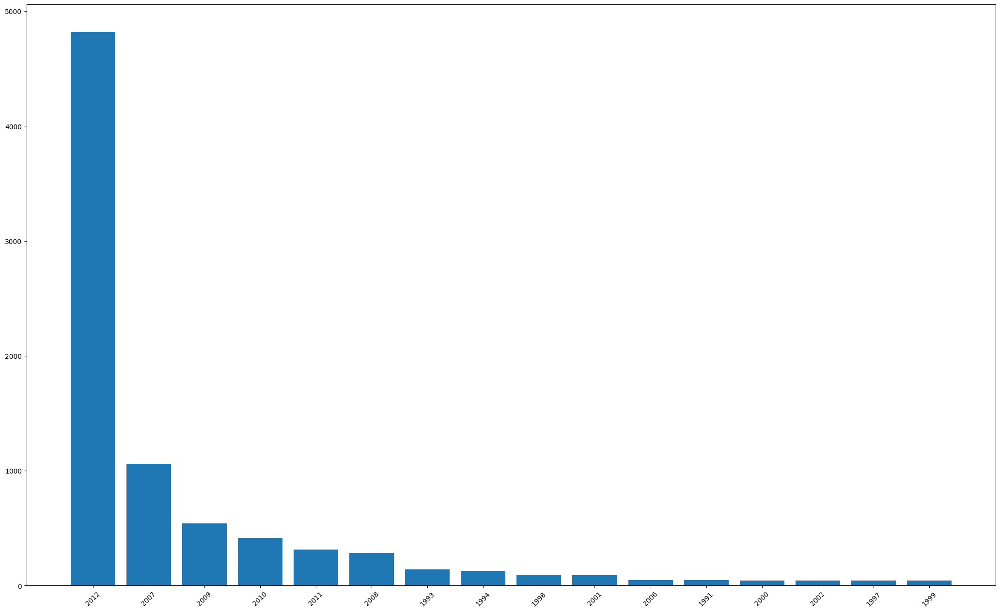

In [50]:
# train_df['carName'].value_counts().plot(kind='bar')

import matplotlib.pyplot as plt
fig = plt.figure(figsize=(20,12))
ax = fig.add_axes([0,0,1,1])
carModel = train_df_EDA['carModel'].value_counts().index
carCounts = train_df_EDA['carModel'].value_counts()
ax.bar(carModel,carCounts)
plt.xticks(rotation=45)
plt.show()

Below mentioned picture depicts the number of car images based on car model year. There are more images of cars which are of model 2012 and very less images belonging to model 1996.

In [51]:
carCounts

carModel
2012    4818
2007    1059
2009     540
2010     413
2011     312
2008     283
1993     139
1994     128
1998      92
2001      90
2006      46
1991      46
2000      45
2002      45
1997      44
1999      44
Name: count, dtype: int64

Almost all classes of cars images have an equal number of images which is of count around 40. There is a class named “GMC savana van 2012” which has 60 images and “Hyundai Accent sedan 2012” which has around 25 images. In below mentioned pictures we can view the class distribution.

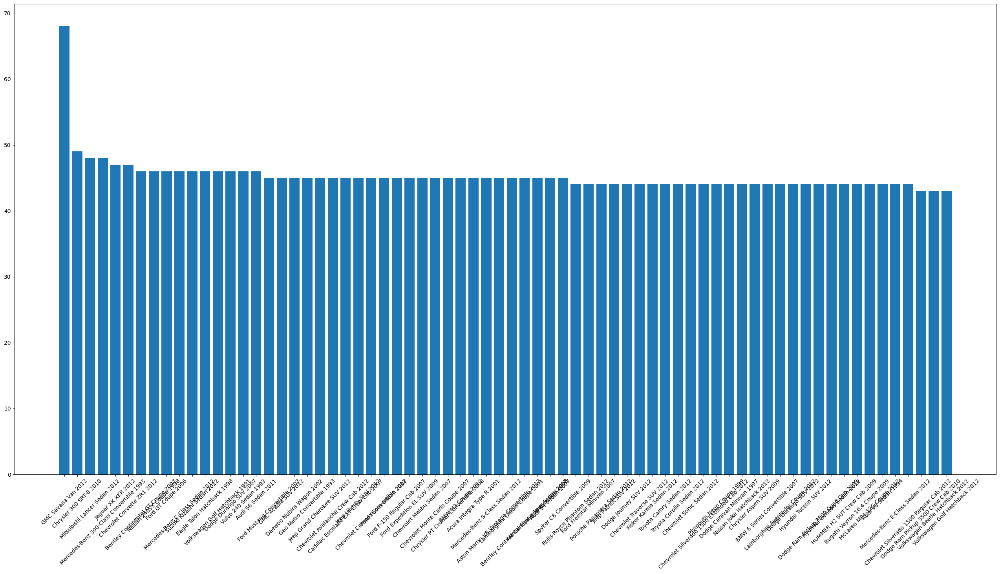

In [52]:
# train_df['carName'].value_counts().plot(kind='bar')

import matplotlib.pyplot as plt
fig = plt.figure(figsize=(25,12))
ax = fig.add_axes([0,0,1,1])
carNames = carsCountDataFrame.iloc[:70,:].index
carCounts = carsCountDataFrame.iloc[:70,:]['count']
ax.bar(carNames,carCounts)
plt.xticks(rotation=45)
plt.show()

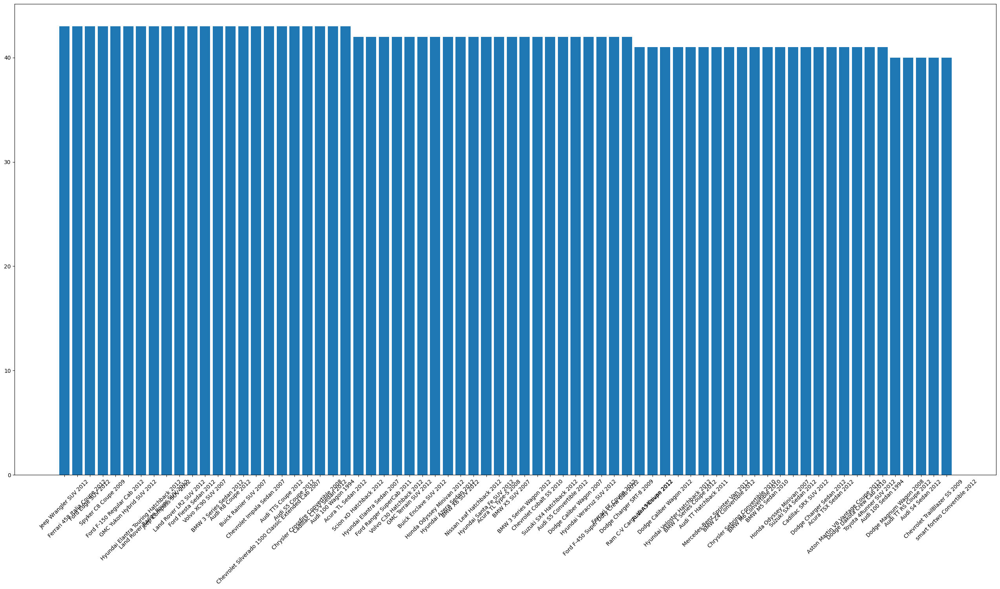

In [53]:
# train_df['carName'].value_counts().plot(kind='bar')

import matplotlib.pyplot as plt
fig = plt.figure(figsize=(25,12))
ax = fig.add_axes([0,0,1,1])
carNames = carsCountDataFrame.iloc[70:140,:].index
carCounts = carsCountDataFrame.iloc[70:140,:]['count']
ax.bar(carNames,carCounts)
plt.xticks(rotation=45)
plt.show()

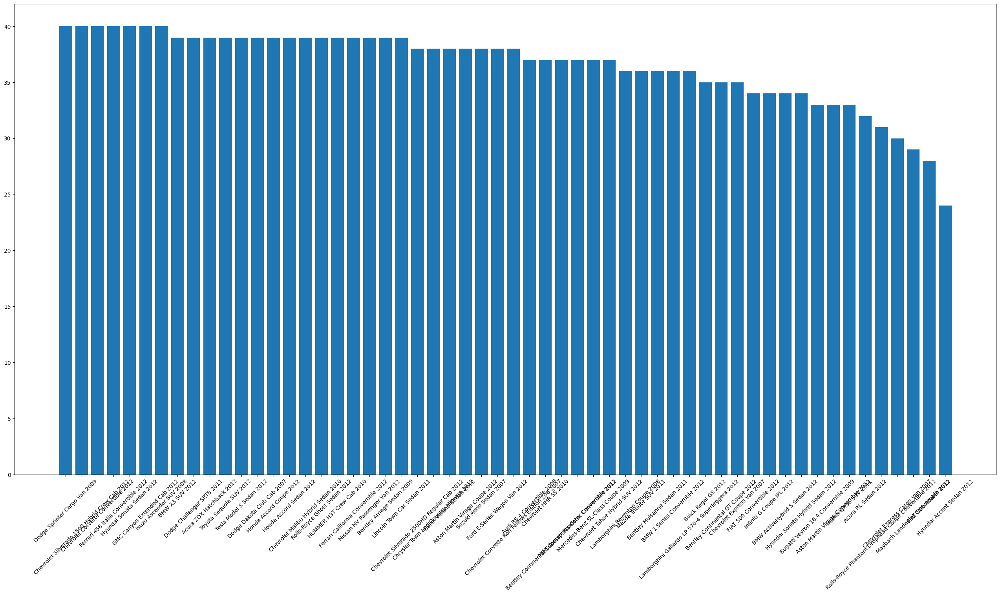

In [54]:
# train_df['carName'].value_counts().plot(kind='bar')

import matplotlib.pyplot as plt
fig = plt.figure(figsize=(25,12))
ax = fig.add_axes([0,0,1,1])
carNames = carsCountDataFrame.iloc[140:,:].index
carCounts = carsCountDataFrame.iloc[140:,:]['count']
ax.bar(carNames,carCounts)
plt.xticks(rotation=45)
plt.show()

In [55]:
train_df_EDA

,imageName,carName,carModel,carModel_1,Image_Name,xmin,ymin,xmax,ymax,Image_class,image_path
0,00198.jpg,Acura Integra Type R 2001,2001,Acura Integra Type R,00198.jpg,91,121,574,357,6,C:/Users/User/Downloads/Car Images/Train Images/
1,00255.jpg,Acura Integra Type R 2001,2001,Acura Integra Type R,00255.jpg,29,78,734,396,6,C:/Users/User/Downloads/Car Images/Train Images/
2,00308.jpg,Acura Integra Type R 2001,2001,Acura Integra Type R,00308.jpg,16,136,775,418,6,C:/Users/User/Downloads/Car Images/Train Images/
3,00374.jpg,Acura Integra Type R 2001,2001,Acura Integra Type R,00374.jpg,9,184,740,499,6,C:/Users/User/Downloads/Car Images/Train Images/
4,00878.jpg,Acura Integra Type R 2001,2001,Acura Integra Type R,00878.jpg,101,162,882,650,6,C:/Users/User/Downloads/Car Images/Train Images/
...,...,...,...,...,...,...,...,...,...,...,...
8139,06632.jpg,Volvo XC90 SUV 2007,2007,Volvo XC90 SUV,06632.jpg,7,7,342,219,195,C:/Users/User/Downloads/Car Images/Train Images/
8140,07369.jpg,Volvo XC90 SUV 2007,2007,Volvo XC90 SUV,07369.jpg,61,47,500,320,195,C:/Users/User/Downloads/Car Images/Train Images/
8141,07413.jpg,Volvo XC90 SUV 2007,2007,Volvo XC90 SUV,07413.jpg,31,62,621,414,195,C:/Users/User/Downloads/Car Images/Train Images/
8142,07609.jpg,Volvo XC90 SUV 2007,2007,Volvo XC90 SUV,07609.jpg,17,12,275,183,195,C:/Users/User/Downloads/Car Images/Train Images/


In [56]:
dfTrain_W_H = df_trainfolder[['Height','Width','imageName']]
train_df_EDA = train_df_EDA.merge(dfTrain_W_H, how='inner', left_on='imageName', right_on='imageName')
train_df_EDA['File'] = df_trainfolder['image_path'] + "/" + df_trainfolder['carName'] + "/" + df_trainfolder['imageName']

train_df_EDA.rename(columns = {'Height_x':'Height'}, inplace = True)
train_df_EDA.rename(columns = {'Width_x':'Width'}, inplace = True)
train_df_EDA.rename(columns = {'Image_class':'Class'}, inplace = True)
train_df_EDA.rename(columns = {'le_carName':'Label'}, inplace = True)

In [57]:
train_df_EDA.head(1)

,imageName,carName,carModel,carModel_1,Image_Name,xmin,ymin,xmax,ymax,Class,image_path,Height,Width,File
0,00198.jpg,Acura Integra Type R 2001,2001,Acura Integra Type R,00198.jpg,91,121,574,357,6,C:/Users/User/Downloads/Car Images/Train Images/,450,600,C:\Users\User\Downloads\Car Images\Train Image...


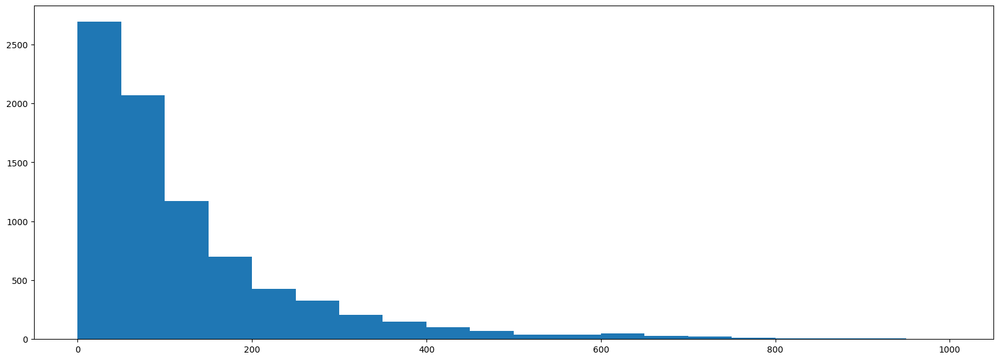

In [58]:
train_df_EDA['Width_difference'] = train_df_EDA['Width'] - (train_df_EDA['xmax'] - train_df_EDA['xmin'])
fig, ax = plt.subplots(figsize =(20, 7))
ax.hist(train_df_EDA['Width_difference'], bins = [0, 50, 100, 150, 200, 250, 300, 350, 400, 450, 500, 550, 600, 650, 700, 750, 800, 850, 900, 950, 1000])
 
# Show plot
plt.show()

Here we are planning to check if all instances of a images share the same location and orientation within the dataset. As it is observed from the graph the location of car within image varies and there are significant count of images where appearance of car is too small compared to the image itself. 

In [59]:
train_df_EDA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8144 entries, 0 to 8143
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   imageName         8144 non-null   object
 1   carName           8144 non-null   object
 2   carModel          8144 non-null   object
 3   carModel_1        8144 non-null   object
 4   Image_Name        8144 non-null   object
 5   xmin              8144 non-null   int64 
 6   ymin              8144 non-null   int64 
 7   xmax              8144 non-null   int64 
 8   ymax              8144 non-null   int64 
 9   Class             8144 non-null   int64 
 10  image_path        8144 non-null   object
 11  Height            8144 non-null   int64 
 12  Width             8144 non-null   int64 
 13  File              8144 non-null   object
 14  Width_difference  8144 non-null   int64 
dtypes: int64(8), object(7)
memory usage: 954.5+ KB


In [60]:
train_df_EDA['size'] =  train_df_EDA.Height * train_df_EDA.Width
train_df_EDA[['carName','imageName','Height','Width']][train_df_EDA['size'] == train_df_EDA['size'].max()]

,carName,imageName,Height,Width
2942,Chevrolet Sonic Sedan 2012,05945.jpg,3744,5616


Above cell shows the image which is of maximum size

Corresponding image is shown in below cell

In [61]:
train_df_EDA

,imageName,carName,carModel,carModel_1,Image_Name,xmin,ymin,xmax,ymax,Class,image_path,Height,Width,File,Width_difference,size
0,00198.jpg,Acura Integra Type R 2001,2001,Acura Integra Type R,00198.jpg,91,121,574,357,6,C:/Users/User/Downloads/Car Images/Train Images/,450,600,C:\Users\User\Downloads\Car Images\Train Image...,117,270000
1,00255.jpg,Acura Integra Type R 2001,2001,Acura Integra Type R,00255.jpg,29,78,734,396,6,C:/Users/User/Downloads/Car Images/Train Images/,422,791,C:\Users\User\Downloads\Car Images\Train Image...,86,333802
2,00308.jpg,Acura Integra Type R 2001,2001,Acura Integra Type R,00308.jpg,16,136,775,418,6,C:/Users/User/Downloads/Car Images/Train Images/,480,800,C:\Users\User\Downloads\Car Images\Train Image...,41,384000
3,00374.jpg,Acura Integra Type R 2001,2001,Acura Integra Type R,00374.jpg,9,184,740,499,6,C:/Users/User/Downloads/Car Images/Train Images/,563,750,C:\Users\User\Downloads\Car Images\Train Image...,19,422250
4,00878.jpg,Acura Integra Type R 2001,2001,Acura Integra Type R,00878.jpg,101,162,882,650,6,C:/Users/User/Downloads/Car Images/Train Images/,768,1024,C:\Users\User\Downloads\Car Images\Train Image...,243,786432
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8139,06632.jpg,Volvo XC90 SUV 2007,2007,Volvo XC90 SUV,06632.jpg,7,7,342,219,195,C:/Users/User/Downloads/Car Images/Train Images/,221,350,C:\Users\User\Downloads\Car Images\Train Image...,15,77350
8140,07369.jpg,Volvo XC90 SUV 2007,2007,Volvo XC90 SUV,07369.jpg,61,47,500,320,195,C:/Users/User/Downloads/Car Images/Train Images/,352,566,C:\Users\User\Downloads\Car Images\Train Image...,127,199232
8141,07413.jpg,Volvo XC90 SUV 2007,2007,Volvo XC90 SUV,07413.jpg,31,62,621,414,195,C:/Users/User/Downloads/Car Images/Train Images/,480,640,C:\Users\User\Downloads\Car Images\Train Image...,50,307200
8142,07609.jpg,Volvo XC90 SUV 2007,2007,Volvo XC90 SUV,07609.jpg,17,12,275,183,195,C:/Users/User/Downloads/Car Images/Train Images/,183,275,C:\Users\User\Downloads\Car Images\Train Image...,17,50325


In [62]:
dfTrain_W_H = pd.read_csv(r"C:\Users\User\Downloads\Car Images\Train Images\train_images.csv")
dfTrain_W_H = dfTrain_W_H[['Height','Width','Image_Name']]
train_df = train_df.merge(dfTrain_W_H, how='inner', left_on='imageName', right_on='Image_Name')
train_df['File'] = train_df['image_path'] + "/" + train_df['carName'] + "/" + train_df['imageName']
train_df.rename(columns = {'Image_class':'Class'}, inplace = True)
train_df.rename(columns = {'le_carName':'Label'}, inplace = True)
train_df.head(1)

,carName,carModel,carModel_1,imageName,Image_Name_x,xmin,ymin,xmax,ymax,Class,image_path,Label,File,Height,Width,Image_Name_y
0,Acura Integra Type R 2001,2001,Acura Integra Type R,00198.jpg,00198.jpg,91,121,574,357,6,C:\Users\User\Downloads\Car Images\Split\train,1,C:\Users\User\Downloads\Car Images\Split\train...,450,600,00198.jpg


In [63]:
train_df_EDA.head(1)

,imageName,carName,carModel,carModel_1,Image_Name,xmin,ymin,xmax,ymax,Class,image_path,Height,Width,File,Width_difference,size
0,00198.jpg,Acura Integra Type R 2001,2001,Acura Integra Type R,00198.jpg,91,121,574,357,6,C:/Users/User/Downloads/Car Images/Train Images/,450,600,C:\Users\User\Downloads\Car Images\Train Image...,117,270000


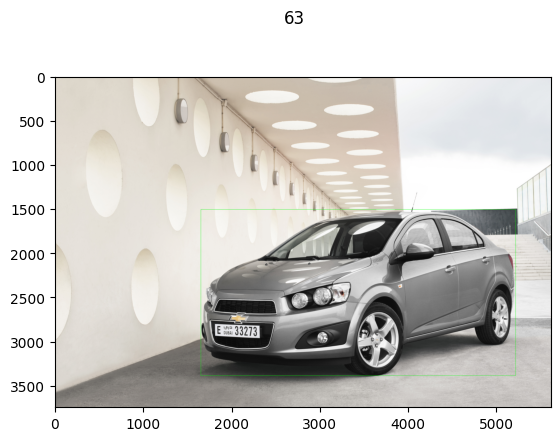

In [189]:
#Pickup a random image number
img_num = 2942
#Read the image and draw a rectangle as per bounding box information
img = cv2.imread(train_df_EDA.loc[img_num,'File'])

#w = train_df_EDA.loc[img_num, 'Width']
#h = train_df_EDA.loc[img_num, 'Height']
#x_ratio = 224/w
#y_ratio = 224/h
cv2.rectangle(img, 
             (int(train_df_EDA.loc[img_num, 'xmin']),int(train_df_EDA.loc[img_num, 'ymin'])),
             (int(train_df_EDA.loc[img_num, 'xmax']),int(train_df_EDA.loc[img_num, 'ymax'])), 
             (0,255,0),
             2)


#Convert BGR format (used by opencv to RGB format used by matplotlib)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Draw image using matplotlib
plt.suptitle(train_df_EDA.loc[img_num, 'Class'])
plt.imshow(img)
plt.show()

In [65]:
train_df_EDA['size'] =  train_df_EDA.Height * train_df_EDA.Width
train_df_EDA[['carName','imageName','Height','Width']][train_df_EDA['size'] == train_df_EDA['size'].min()]

,carName,imageName,Height,Width
2339,Chevrolet Corvette Ron Fellows Edition Z06 2007,00097.jpg,58,78
2373,Chevrolet Corvette Ron Fellows Edition Z06 2007,07469.jpg,58,78


In [66]:
train_df_EDA.iloc[2942]

imageName                                                   05945.jpg
carName                                    Chevrolet Sonic Sedan 2012
carModel                                                         2012
carModel_1                                      Chevrolet Sonic Sedan
Image_Name                                                  05945.jpg
xmin                                                             1648
ymin                                                             1508
xmax                                                             5205
ymax                                                             3389
Class                                                              63
image_path           C:/Users/User/Downloads/Car Images/Train Images/
Height                                                           3744
Width                                                            5616
File                C:\Users\User\Downloads\Car Images\Train Image...
Width_difference    

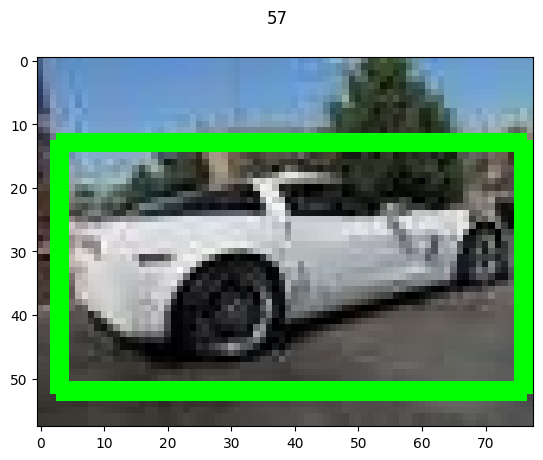

In [67]:
#Pickup a random image number
img_num = 2373
#Read the image and draw a rectangle as per bounding box information
img = cv2.imread(train_df_EDA.loc[img_num,'File'])

#w = train_df_EDA.loc[img_num, 'Width']
#h = train_df_EDA.loc[img_num, 'Height']
#x_ratio = 224/w
#y_ratio = 224/h
cv2.rectangle(img, 
             (int(train_df_EDA.loc[img_num, 'xmin']),int(df_trainfolder.loc[img_num, 'ymin'])),
             (int(train_df_EDA.loc[img_num, 'xmax']),int(df_trainfolder.loc[img_num, 'ymax'])), 
             (0,255,0),
             2)


#Convert BGR format (used by opencv to RGB format used by matplotlib)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Draw image using matplotlib
plt.suptitle(train_df_EDA.loc[img_num, 'Class'])
plt.imshow(img)
plt.show()

In [68]:
# test_df
test_df['size'] =  test_df.Height * test_df.Width
test_df[test_df['size'] == test_df['size'].max()]

,carName,carModel,carModel_1,imageName,Image_Name,xmin,ymin,xmax,ymax,Class,image_path,Label,Height,Width,File,size
2925,Chevrolet Tahoe Hybrid SUV 2012,2012,Chevrolet Tahoe Hybrid SUV,03216.jpg,03216.jpg,595,447,7224,3835,62,C:\Users\User\Downloads\Car Images\Test Images,72,5400,7800,C:\Users\User\Downloads\Car Images\Test Images...,42120000


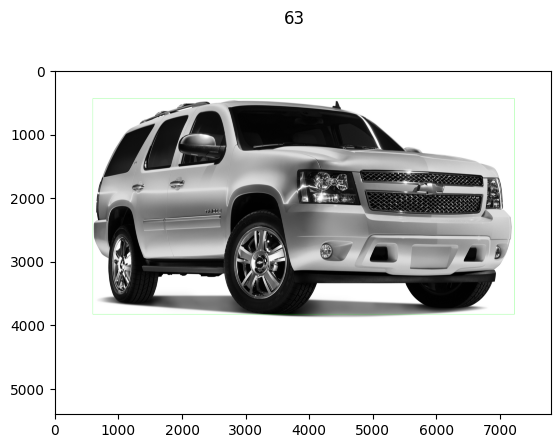

In [69]:
#Pickup a random image number
img_num = 2925
#Read the image and draw a rectangle as per bounding box information
img = cv2.imread(test_df.loc[img_num,'File'])

#w = train_df_EDA.loc[img_num, 'Width']
#h = train_df_EDA.loc[img_num, 'Height']
#x_ratio = 224/w
#y_ratio = 224/h
cv2.rectangle(img, 
             (int(test_df.loc[img_num, 'xmin']),int(test_df.loc[img_num, 'ymin'])),
             (int(test_df.loc[img_num, 'xmax']),int(test_df.loc[img_num, 'ymax'])), 
             (0,255,0),
             2)


#Convert BGR format (used by opencv to RGB format used by matplotlib)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Draw image using matplotlib
plt.suptitle(train_df_EDA.loc[img_num, 'Class'])
plt.imshow(img)
plt.show()

In [70]:
test_df['size'] =  test_df.Height * test_df.Width
test_df[test_df['size'] == test_df['size'].min()]

,carName,carModel,carModel_1,imageName,Image_Name,xmin,ymin,xmax,ymax,Class,image_path,Label,Height,Width,File,size
265,AM General Hummer SUV 2000,2000,AM General Hummer SUV,03246.jpg,03246.jpg,9,3,93,41,1,C:\Users\User\Downloads\Car Images\Test Images,0,41,101,C:\Users\User\Downloads\Car Images\Test Images...,4141


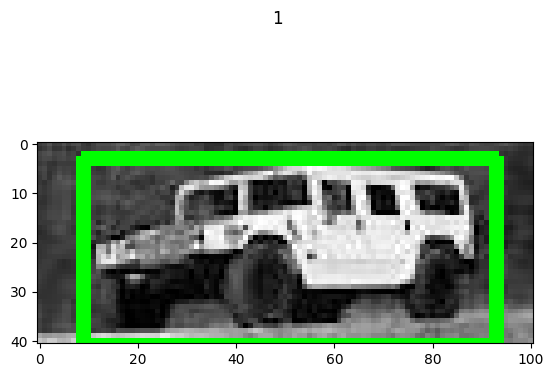

In [71]:
#Pickup a random image number
img_num = 265
#Read the image and draw a rectangle as per bounding box information
img = cv2.imread(test_df.loc[img_num,'File'])

#w = train_df_EDA.loc[img_num, 'Width']
#h = train_df_EDA.loc[img_num, 'Height']
#x_ratio = 224/w
#y_ratio = 224/h
cv2.rectangle(img, 
             (int(test_df.loc[img_num, 'xmin']),int(test_df.loc[img_num, 'ymin'])),
             (int(test_df.loc[img_num, 'xmax']),int(test_df.loc[img_num, 'ymax'])), 
             (0,255,0),
             2)


#Convert BGR format (used by opencv to RGB format used by matplotlib)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Draw image using matplotlib
plt.suptitle(train_df_EDA.loc[img_num, 'Class'])
plt.imshow(img)
plt.show()

In [72]:
from numpy.linalg import norm

def brightness(img):
    if len(img.shape) == 3:
        # create brightness with euclidean norm
        return np.average(norm(img, axis=2)) / np.sqrt(3)
    else:
        # Grayscale
        return np.average(img)

In [73]:
import numpy as np

brightness(cv2.imread(train_df.loc[2,'File']))

156.03411916804794

## Display sample data with bounding boxes

#### Display sample data for Train set images

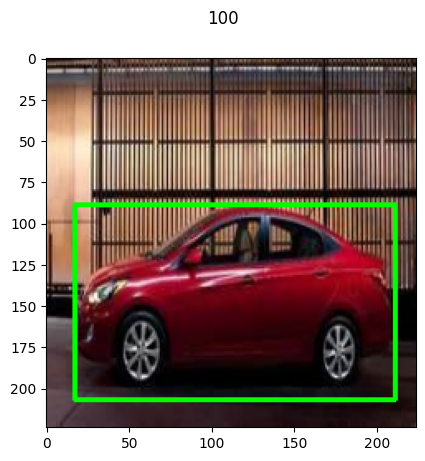

In [193]:
#Pickup a random image number
img_num = np.random.randint(0, train_df.shape[0])
#Read the image and draw a rectangle as per bounding box information
img = cv2.imread(train_df.loc[img_num,'File'])
img = cv2.resize(img,(224, 224))

w = train_df.loc[img_num, 'Width']
h = train_df.loc[img_num, 'Height']
x_ratio = 224/w
y_ratio = 224/h
cv2.rectangle(img, 
             (int(train_df.loc[img_num, 'xmin']*x_ratio),int(train_df.loc[img_num, 'ymin']*y_ratio)),
             (int(train_df.loc[img_num, 'xmax']*x_ratio),int(train_df.loc[img_num, 'ymax']*y_ratio)), 
             (0,255,0),
             2)


#Convert BGR format (used by opencv to RGB format used by matplotlib)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Draw image using matplotlib
plt.suptitle(train_df_EDA.loc[img_num, 'Class'])
plt.imshow(img)
plt.show()

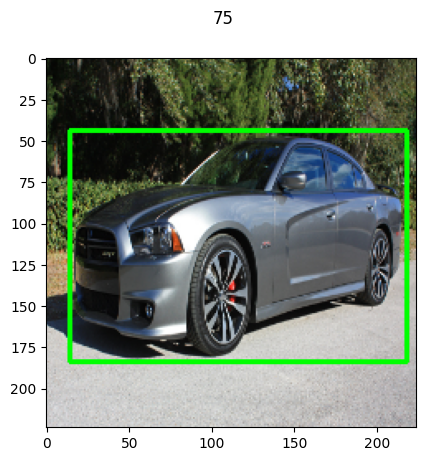

In [195]:
#Pickup a random image number
img_num = np.random.randint(0, train_df.shape[0])
#Read the image and draw a rectangle as per bounding box information
img = cv2.imread(train_df.loc[img_num,'File'])
img = cv2.resize(img,(224, 224))

w = train_df.loc[img_num, 'Width']
h = train_df.loc[img_num, 'Height']
x_ratio = 224/w
y_ratio = 224/h
cv2.rectangle(img, 
             (int(train_df.loc[img_num, 'xmin']*x_ratio),int(train_df.loc[img_num, 'ymin']*y_ratio)),
             (int(train_df.loc[img_num, 'xmax']*x_ratio),int(train_df.loc[img_num, 'ymax']*y_ratio)), 
             (0,255,0),
             2)


#Convert BGR format (used by opencv to RGB format used by matplotlib)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Draw image using matplotlib
plt.suptitle(train_df_EDA.loc[img_num, 'Class'])
plt.imshow(img)
plt.show()

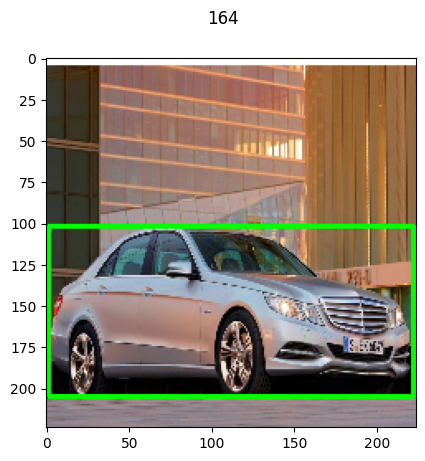

In [196]:
#Pickup a random image number
img_num = np.random.randint(0, test_df.shape[0])
#Read the image and draw a rectangle as per bounding box information
img = cv2.imread(test_df.loc[img_num,'File'])
img = cv2.resize(img,(224, 224))

w = test_df.loc[img_num, 'Width']
h = test_df.loc[img_num, 'Height']
x_ratio = 224/w
y_ratio = 224/h
cv2.rectangle(img, 
             (int(test_df.loc[img_num, 'xmin']*x_ratio),int(test_df.loc[img_num, 'ymin']*y_ratio)),
             (int(test_df.loc[img_num, 'xmax']*x_ratio),int(test_df.loc[img_num, 'ymax']*y_ratio)), 
             (0,255,0),
             2)


#Convert BGR format (used by opencv to RGB format used by matplotlib)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Draw image using matplotlib
plt.suptitle(test_df.loc[img_num, 'Class'])
plt.imshow(img)
plt.show()

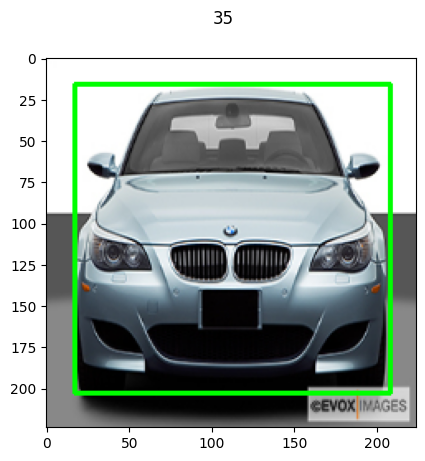

In [197]:
#Pickup a random image number
img_num = np.random.randint(0, test_df.shape[0])
#Read the image and draw a rectangle as per bounding box information
img = cv2.imread(test_df.loc[img_num,'File'])
img = cv2.resize(img,(224, 224))

w = test_df.loc[img_num, 'Width']
h = test_df.loc[img_num, 'Height']
x_ratio = 224/w
y_ratio = 224/h
cv2.rectangle(img, 
             (int(test_df.loc[img_num, 'xmin']*x_ratio),int(test_df.loc[img_num, 'ymin']*y_ratio)),
             (int(test_df.loc[img_num, 'xmax']*x_ratio),int(test_df.loc[img_num, 'ymax']*y_ratio)), 
             (0,255,0),
             2)


#Convert BGR format (used by opencv to RGB format used by matplotlib)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Draw image using matplotlib
plt.suptitle(test_df.loc[img_num, 'Class'])
plt.imshow(img)
plt.show()

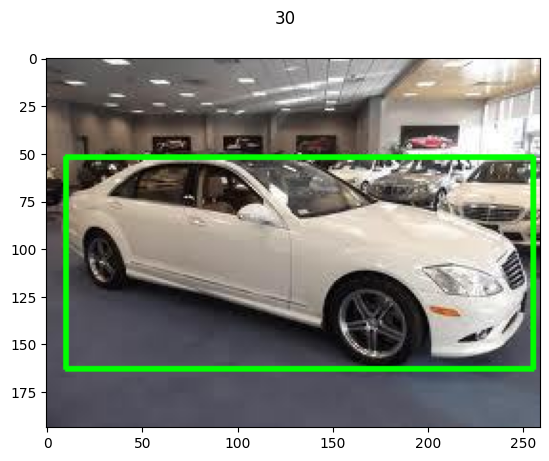

In [78]:
#Pickup a random image number
img_num = np.random.randint(0, val_df.shape[0])
#Read the image and draw a rectangle as per bounding box information
img = cv2.imread(val_df.loc[img_num,'File'])

#w = train_df_EDA.loc[img_num, 'Width']
#h = train_df_EDA.loc[img_num, 'Height']
#x_ratio = 224/w
#y_ratio = 224/h
cv2.rectangle(img, 
             (int(val_df.loc[img_num, 'xmin']),int(val_df.loc[img_num, 'ymin'])),
             (int(val_df.loc[img_num, 'xmax']),int(val_df.loc[img_num, 'ymax'])), 
             (0,255,0),
             2)


#Convert BGR format (used by opencv to RGB format used by matplotlib)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Draw image using matplotlib
plt.suptitle(train_df_EDA.loc[img_num, 'Class'])
plt.imshow(img)
plt.show()

#### Checking number of classes in each dataframe

In [79]:
#Create a dictionary to hold label and corresponding class name
num_classes_train = train_df['Label'].unique()
print(len(num_classes_train))

196


In [80]:
#Create a dictionary to hold label and corresponding class name
num_classes_val = val_df['Label'].unique()
print(len(num_classes_val))

196


In [81]:
#Create a dictionary to hold label and corresponding class name
num_classes_test = test_df['Label'].unique()
label_class_dict = dict(zip(test_df['Label'], test_df['carName']))
print(len(num_classes_test))

196


In [82]:
num_classes = train_df['Label'].unique()

## Model building for Efficient Net B7

#### Build a Batch Generator

In [83]:
import tensorflow as tf

In [84]:
img_size = 224

In [85]:
def batch_generator(df, batch_size=32):

    while True:

        #Create indexes
        image_nums = np.random.randint(0,df.shape[0], size=batch_size)

        #Create empty arrays
        #1. To hold image input
        batch_images = np.zeros(shape=(batch_size, img_size, img_size, 3))

        #Classification Labels 
        batch_labels = np.zeros(shape=(batch_size, len(num_classes)))
        
        #Regression labels - 4 numbers per example image
        batch_bboxes = np.zeros(shape=(batch_size, 4))
        

        for i in range(batch_size):

            #Read image and resize
            img = tf.keras.preprocessing.image.load_img(df.loc[image_nums[i], 'File'], 
                                                        target_size=(img_size, img_size))
            
            #Conver to numpy array
            img_array = tf.keras.preprocessing.image.img_to_array(img)

            #Update batch
            batch_images[i] = img_array

            #Read image classification label & convert to one hot vector
            cl_label = df.loc[image_nums[i], 'Label']
            cl_label = tf.keras.utils.to_categorical(cl_label, num_classes=len(num_classes))
            batch_labels[i] = cl_label

            #Read and resize bounding box co-ordinates
            img_width = df.loc[image_nums[i], 'Width']
            img_height = df.loc[image_nums[i], 'Height']
            
            xmin = df.loc[image_nums[i], 'xmin'] * img_size/img_width
            xmax = df.loc[image_nums[i], 'xmax'] * img_size/img_width

            ymin = df.loc[image_nums[i], 'ymin'] * img_size/img_height
            ymax = df.loc[image_nums[i], 'ymax'] * img_size/img_height

            #We will ask model to predict xmin, ymin, width and height of bounding box
            batch_bboxes[i] = [xmin, ymin, xmax-xmin, ymax-ymin]

        #Normalize batch images as per Pre-trained model to be used
        batch_images[i] = tf.keras.applications.efficientnet.preprocess_input(batch_images[i])
        
        #Make bounding boxes (x, y, w, h) as numbers between 0 and 1 - this seems to work better
        batch_bboxes = batch_bboxes/img_size

        #Return batch - use yield function to make it a python generator
        yield batch_images, [batch_labels, batch_bboxes]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(2, 224, 224, 3)
(2, 196) (2, 4)
[array([[0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
     

<Figure size 1000x400 with 0 Axes>

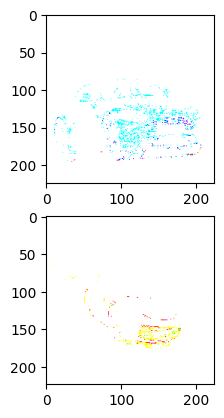

In [86]:
gen = batch_generator(train_df, batch_size=2)
X, y = next(gen)
print(X.shape)
print(y[0].shape, y[1].shape)
print(y)

from tensorflow.keras.utils import to_categorical

ll1111 = []
# label_encoder.inverse_transform(y[0][0])
for i in range(0,len(y[0])):
  y1 = int(np.argmax(y[0][i], axis=-1))
  ll1111.extend([y1])

print(len(ll1111))
print(label_encoder.inverse_transform(ll1111))

plt.figure(figsize =(10, 4))

#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(len(y[0]),1) 

for i in range(0,len(y[0])):
  axarr[i].imshow(X[i])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(2, 224, 224, 3)
(2, 196) (2, 4)
[array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
     

<Figure size 1000x400 with 0 Axes>

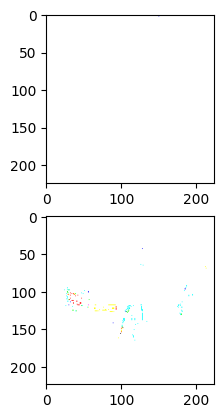

In [87]:
gen = batch_generator(val_df, batch_size=2)
X, y = next(gen)
print(X.shape)
print(y[0].shape, y[1].shape)
print(y)

ll1111 = []
# label_encoder.inverse_transform(y[0][0])
for i in range(0,len(y[0])):
  y1 = int(np.argmax(y[0][i], axis=-1))
  ll1111.extend([y1])

print(len(ll1111))
print(label_encoder.inverse_transform(ll1111))

plt.figure(figsize =(10, 4))

#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(len(y[0]),1) 

for i in range(0,len(y[0])):
  axarr[i].imshow(X[i])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(2, 224, 224, 3)
(2, 196) (2, 4)
[array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
     

<Figure size 1000x400 with 0 Axes>

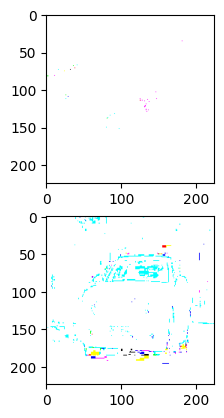

In [88]:
gen = batch_generator(test_df, batch_size=2)
X, y = next(gen)
print(X.shape)
print(y[0].shape, y[1].shape)
print(y)

ll1111 = []
# label_encoder.inverse_transform(y[0][0])
for i in range(0,len(y[0])):
  y1 = int(np.argmax(y[0][i], axis=-1))
  ll1111.extend([y1])

print(len(ll1111))
print(label_encoder.inverse_transform(ll1111))

plt.figure(figsize =(10, 4))

#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(len(y[0]),1) 

for i in range(0,len(y[0])):
  axarr[i].imshow(X[i])

#### Load Pre-Trained Model

In [89]:
tf.keras.backend.clear_session()
model = tf.keras.applications.efficientnet.EfficientNetB7(include_top=False, #Do not include FC layer at the end
                                       input_shape=(224, 224, 3),
                                       weights='imagenet')

In [90]:
model.summary()

Model: "efficientnetb7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 tf.math.truediv (TFOpLambda)   (None, 224, 224, 3)  0           ['normalization[0][0

#### Un-Freeze Few layers of Pre-trained model

In [91]:
len(model.layers)

814

In [92]:
model.layers

In [93]:
# for layer in model.layers:
#     layer.trainable = True

# # # #Set pre-trained model layers to not trainable
for layer in model.layers:
    layer.trainable = True
#######Unfreezing all layers after layer#
for layer in model.layers[0:351]:
    layer.trainable = False
    # print(layer)

In [94]:
model.summary()

Model: "efficientnetb7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 tf.math.truediv (TFOpLambda)   (None, 224, 224, 3)  0           ['normalization[0][0

In [95]:
model.output

<KerasTensor: shape=(None, 7, 7, 2560) dtype=float32 (created by layer 'top_activation')>

#### Add Final layers to the model

In [96]:
#get Output layer of Pre-trained model
x1 = model.output

#Flatten the output to feed to Dense layer
x2 = tf.keras.layers.GlobalAveragePooling2D()(x1)

#Add one Dense layer
x3 = tf.keras.layers.Dense(2560, activation='relu')(x2)

#Batch Norm
x5 = tf.keras.layers.BatchNormalization()(x3)

#### Build layer for Classification Label output

In [97]:
#Classification
label_output = tf.keras.layers.Dense(len(num_classes), 
                                     activation='softmax', 
                                     name='class_op')(x5)

In [98]:
label_output

<KerasTensor: shape=(None, 196) dtype=float32 (created by layer 'class_op')>

#### Build layer for bounding box output

In [99]:
#Regression
bbox_output = tf.keras.layers.Dense(4, 
                                    activation='sigmoid', 
                                    name='reg_op')(x5)

In [100]:
bbox_output

<KerasTensor: shape=(None, 4) dtype=float32 (created by layer 'reg_op')>

#### Finalize the model

In [101]:
#Non Sequential model as it has two different outputs
final_model = tf.keras.models.Model(inputs=model.input, #Pre-trained model input as input layer
                                    outputs=[label_output,bbox_output]) #Output layer added

In [102]:
final_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 tf.math.truediv (TFOpLambda)   (None, 224, 224, 3)  0           ['normalization[0][0]']      

#### Define function to calculate IoU

In [103]:
def calculate_iou(y_true, y_pred):
    
    
    """
    Input:
    Keras provides the input as numpy arrays with shape (batch_size, num_columns).
    
    Arguments:
    y_true -- first box, numpy array with format [x, y, width, height, conf_score]
    y_pred -- second box, numpy array with format [x, y, width, height, conf_score]
    x any y are the coordinates of the top left corner of each box.
    
    Output: IoU of type float32. (This is a ratio. Max is 1. Min is 0.)
    
    """

    
    results = []
    
    for i in range(0,y_true.shape[0]):
    
        # set the types so we are sure what type we are using
        y_true = np.array(y_true, dtype=np.float32)
        y_pred = np.array(y_pred, dtype=np.float32)

        #print(y_true.shape)
        #print(y_pred.shape)
        # boxTrue
        x_boxTrue_tleft = y_true[i,0]  # numpy index selection
        y_boxTrue_tleft = y_true[i,1]
        boxTrue_width = y_true[i,2]
        boxTrue_height = y_true[i,3]
        area_boxTrue = (boxTrue_width * boxTrue_height)

        # boxPred
        x_boxPred_tleft = y_pred[i,0]
        y_boxPred_tleft = y_pred[i,1]
        boxPred_width = y_pred[i,2]
        boxPred_height = y_pred[i,3]
        area_boxPred = (boxPred_width * boxPred_height)

        # calculate the bottom right coordinates for boxTrue and boxPred

        # boxTrue
        x_boxTrue_br = x_boxTrue_tleft + boxTrue_width
        y_boxTrue_br = y_boxTrue_tleft + boxTrue_height # Version 2 revision

        # boxPred
        x_boxPred_br = x_boxPred_tleft + boxPred_width
        y_boxPred_br = y_boxPred_tleft + boxPred_height # Version 2 revision


        # calculate the top left and bottom right coordinates for the intersection box, boxInt

        # boxInt - top left coords
        x_boxInt_tleft = np.max([x_boxTrue_tleft,x_boxPred_tleft])
        y_boxInt_tleft = np.max([y_boxTrue_tleft,y_boxPred_tleft]) # Version 2 revision

        # boxInt - bottom right coords
        x_boxInt_br = np.min([x_boxTrue_br,x_boxPred_br])
        y_boxInt_br = np.min([y_boxTrue_br,y_boxPred_br]) 

        # Calculate the area of boxInt, i.e. the area of the intersection 
        # between boxTrue and boxPred.
        # The np.max() function forces the intersection area to 0 if the boxes don't overlap.
        
        
        # Version 2 revision
        area_of_intersection = \
        np.max([0,(x_boxInt_br - x_boxInt_tleft)]) * np.max([0,(y_boxInt_br - y_boxInt_tleft)])

        iou = area_of_intersection / ((area_boxTrue + area_boxPred) - area_of_intersection)


        # This must match the type used in py_func
        iou = np.array(iou, dtype=np.float32)
        
        # append the result to a list at the end of each loop
        results.append(iou)
    
    # return the mean IoU score for the batch
    return np.mean(results)



def IoU(y_true, y_pred):
    
    # Note: the type float32 is very important. It must be the same type as the output from
    # the python function above or you too may spend many late night hours 
    # trying to debug and almost give up.
    
    iou = tf.py_function(calculate_iou, [y_true, y_pred], tf.float32)

    return iou

In [104]:
optimizerVar = tf.keras.optimizers.Adam()
final_model.compile(optimizer=optimizerVar, 
                    loss={'reg_op':'mse', 'class_op':'categorical_crossentropy'},
                    metrics={'reg_op':[IoU], 'class_op':['accuracy']})

#### Train the model

In [105]:
#Create train and test generator
batchsize = 32
train_generator = batch_generator(train_df, batch_size=batchsize) #batchsize can be changed
test_generator = batch_generator(val_df, batch_size=batchsize)

In [106]:
checkpoint_filepath = "C:/Users/User/Downloads/Car Images/Checkpoint/"
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_class_op_accuracy',
    mode='max',
    save_best_only=True)

In [107]:
history_1 = final_model.fit(train_generator,
                epochs=10,
                steps_per_epoch= train_df.shape[0]//batchsize,validation_data=test_generator,
                validation_steps = val_df.shape[0]//batchsize, callbacks=[model_checkpoint_callback])

Epoch 1/10
201/201 [==============================] - 78s 304ms/step - loss: 5.0550 - class_op_loss: 5.0078 - reg_op_loss: 0.0472 - class_op_accuracy: 0.1650 - reg_op_IoU: 0.4677 - val_loss: 719.3764 - val_class_op_loss: 719.1571 - val_reg_op_loss: 0.2194 - val_class_op_accuracy: 0.0183 - val_reg_op_IoU: 0.1064
Epoch 2/10
201/201 [==============================] - 58s 289ms/step - loss: 2.2342 - class_op_loss: 2.2236 - reg_op_loss: 0.0106 - class_op_accuracy: 0.4812 - reg_op_IoU: 0.6833 - val_loss: 2.9190 - val_class_op_loss: 2.9090 - val_reg_op_loss: 0.0100 - val_class_op_accuracy: 0.3921 - val_reg_op_IoU: 0.6985
Epoch 3/10
201/201 [==============================] - 58s 287ms/step - loss: 1.1077 - class_op_loss: 1.0982 - reg_op_loss: 0.0095 - class_op_accuracy: 0.7242 - reg_op_IoU: 0.6950 - val_loss: 2.4066 - val_class_op_loss: 2.3961 - val_reg_op_loss: 0.0105 - val_class_op_accuracy: 0.5024 - val_reg_op_IoU: 0.6489
Epoch 4/10
201/201 [==============================] - 58s 287ms/step 

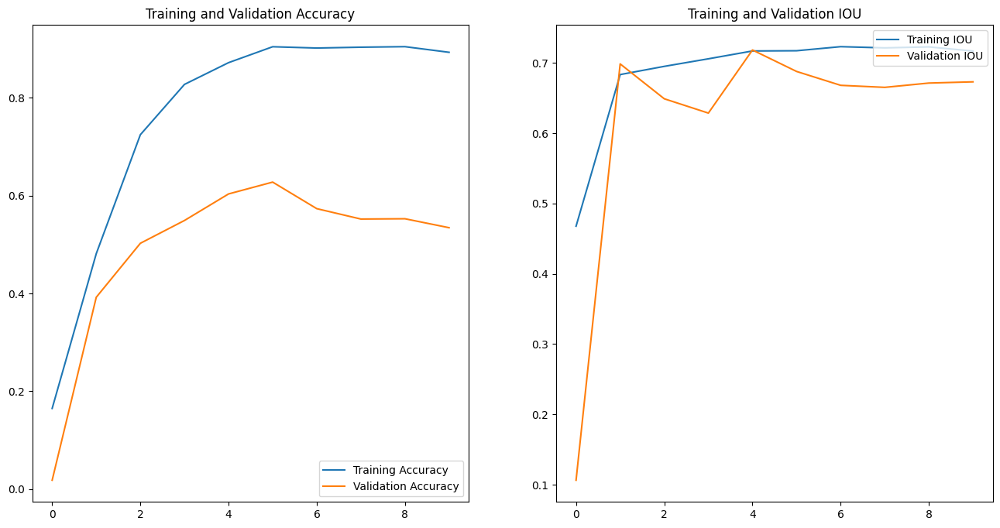

In [108]:
acc = history_1.history['class_op_accuracy']
val_acc = history_1.history['val_class_op_accuracy']

iou = history_1.history['reg_op_IoU']
val_iou = history_1.history['val_reg_op_IoU']

epochs_range = range(10)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, iou, label='Training IOU')
plt.plot(epochs_range, val_iou, label='Validation IOU')
plt.legend(loc='upper right')
plt.title('Training and Validation IOU')
plt.show()

In [109]:
optimizerVar = tf.keras.optimizers.Adam(lr=0.0001)
final_model.compile(optimizer=optimizerVar, 
                    loss={'reg_op':'mse', 'class_op':'categorical_crossentropy'},
                    metrics={'reg_op':[IoU], 'class_op':['accuracy']})

In [110]:
batchsize=16
history_2 = final_model.fit(train_generator,
                epochs=25,
                initial_epoch=10,
                steps_per_epoch= train_df.shape[0]//batchsize,validation_data=test_generator,
                validation_steps = val_df.shape[0]//batchsize)

Epoch 11/25
402/402 [==============================] - 127s 283ms/step - loss: 0.1007 - class_op_loss: 0.0941 - reg_op_loss: 0.0066 - class_op_accuracy: 0.9740 - reg_op_IoU: 0.7490 - val_loss: 1.2141 - val_class_op_loss: 1.2077 - val_reg_op_loss: 0.0064 - val_class_op_accuracy: 0.7429 - val_reg_op_IoU: 0.7596
Epoch 12/25
402/402 [==============================] - 112s 278ms/step - loss: 0.0247 - class_op_loss: 0.0194 - reg_op_loss: 0.0053 - class_op_accuracy: 0.9948 - reg_op_IoU: 0.7653 - val_loss: 1.1710 - val_class_op_loss: 1.1658 - val_reg_op_loss: 0.0053 - val_class_op_accuracy: 0.7465 - val_reg_op_IoU: 0.7701
Epoch 13/25
402/402 [==============================] - 108s 268ms/step - loss: 0.0189 - class_op_loss: 0.0142 - reg_op_loss: 0.0047 - class_op_accuracy: 0.9975 - reg_op_IoU: 0.7747 - val_loss: 1.0594 - val_class_op_loss: 1.0543 - val_reg_op_loss: 0.0051 - val_class_op_accuracy: 0.7745 - val_reg_op_IoU: 0.7769
Epoch 14/25
402/402 [==============================] - 109s 271ms/s

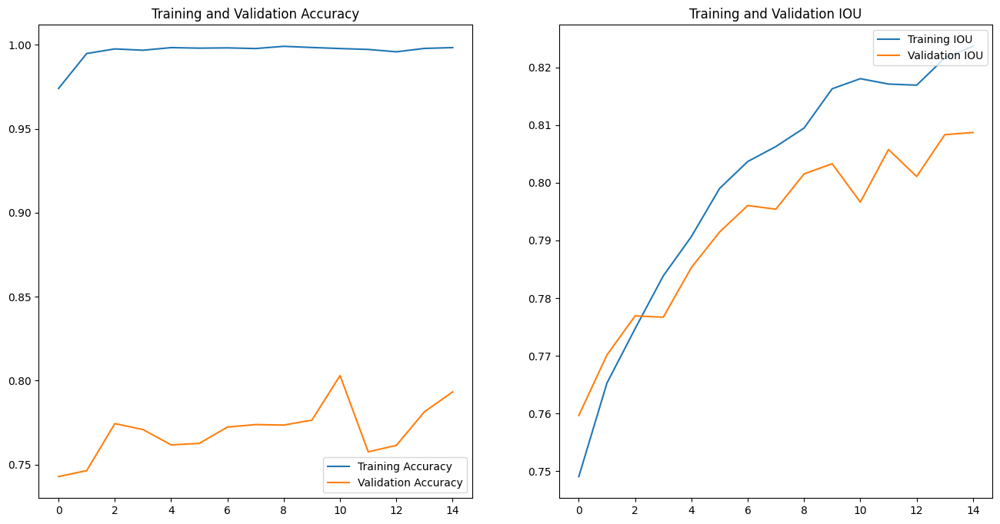

In [111]:
acc = history_2.history['class_op_accuracy']
val_acc = history_2.history['val_class_op_accuracy']

iou = history_2.history['reg_op_IoU']
val_iou = history_2.history['val_reg_op_IoU']

epochs_range = range(15)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, iou, label='Training IOU')
plt.plot(epochs_range, val_iou, label='Validation IOU')
plt.legend(loc='upper right')
plt.title('Training and Validation IOU')
plt.show()

In [113]:
final_model.save('C:/Users/User/Downloads/Car Images/Cars_196_dataset_localization_Adam_EfficientNet_Epoch30_V1.h5')


#### Model Prediction

In [114]:
def predict_and_draw(image_num, df):

    #Load image
    img = tf.keras.preprocessing.image.load_img(df.loc[image_num, 'File'])
    w, h = img.size

    #Prepare input for model
    #1. Resize image
    img_resized = img.resize((img_size, img_size))
    #2. Conver to array and make it a batch of 1
    input_array = tf.keras.preprocessing.image.img_to_array(img_resized)
    input_array = np.expand_dims(input_array, axis=0)

    #3. Normalize image data
    input_array = tf.keras.applications.efficientnet.preprocess_input(input_array)

    #Prediction
    pred = final_model.predict(input_array)
    #Get classification and regression predictions
    label_pred, bbox_pred = pred[0][0], pred[1][0]
    #Get Label with highest probability
    pred_class = label_class_dict[np.argmax(label_pred)]

    #Read actual label and bounding box
    act_class = df.loc[image_num, 'Class']
    act_class = df.loc[image_num, 'carName']
    xmin, ymin, xmax, ymax = df.loc[image_num, ['xmin', 'ymin', 'xmax', 'ymax']]

    print('Real Label :', act_class, '\nPredicted Label: ', pred_class)
    
    #Draw bounding boxes - Actual (Red) and Predicted(Green)
    img = cv2.imread(df.loc[image_num, 'File'])
    
    #Draw actual bounding box - Red
    img = cv2.rectangle(img, (xmin, ymin), 
                        (xmax, ymax), (0,0,255), 3)
    
    #Draw predicted bounding box -  Green
    img = cv2.rectangle(img, (int(bbox_pred[0]*w), int(bbox_pred[1]*h)), 
                        (int((bbox_pred[0]+bbox_pred[2])*w), int((bbox_pred[1]+bbox_pred[3])*h)), (0,255,0), 3
                        )

    #Display the picture
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()

1/1 [==============================] - 3s 3s/step
Real Label : Audi 100 Sedan 1994 
Predicted Label:  Audi 100 Sedan 1994


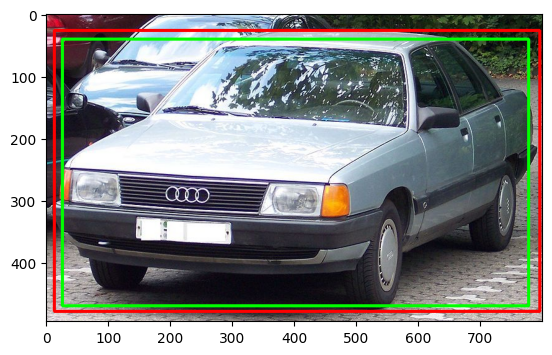

1/1 [==============================] - 0s 26ms/step
Real Label : Chevrolet Silverado 2500HD Regular Cab 2012 
Predicted Label:  Chevrolet Silverado 2500HD Regular Cab 2012


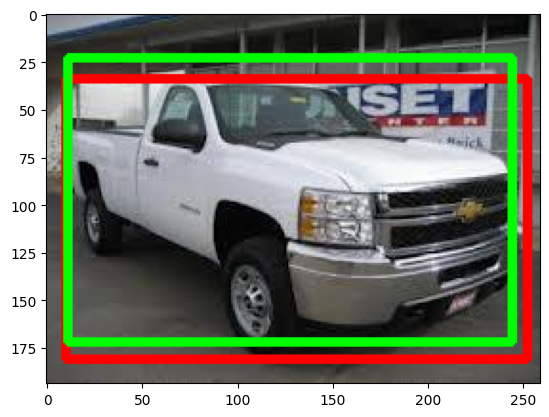

1/1 [==============================] - 0s 29ms/step
Real Label : Chevrolet Camaro Convertible 2012 
Predicted Label:  Ford Focus Sedan 2007


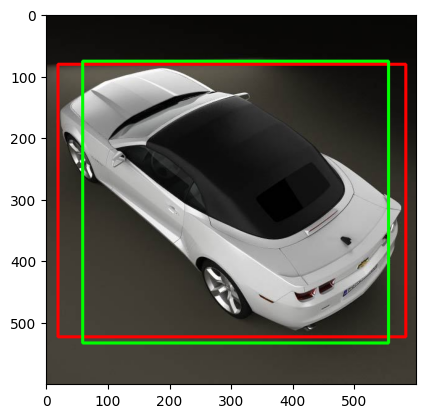

1/1 [==============================] - 0s 25ms/step
Real Label : Chevrolet HHR SS 2010 
Predicted Label:  Chevrolet HHR SS 2010


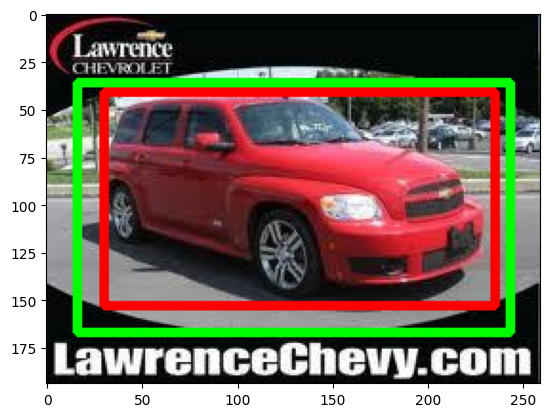

1/1 [==============================] - 0s 27ms/step
Real Label : Volkswagen Beetle Hatchback 2012 
Predicted Label:  Volkswagen Beetle Hatchback 2012


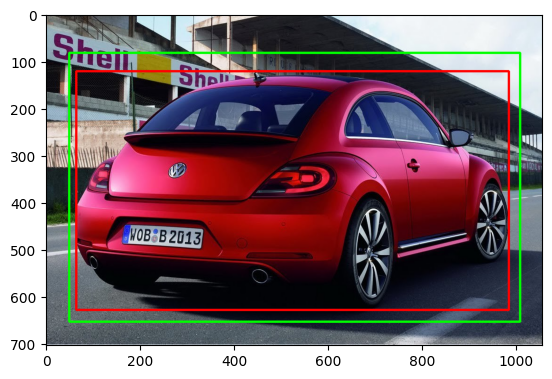

In [115]:
#Predict on Test Dataset
for i in range(0,5):
  image_num = np.random.randint(0, test_df.shape[0])
  predict_and_draw(image_num, test_df)

In [116]:
testData_generator = batch_generator(test_df, batch_size=16)

print('Evaluating')
test_results = final_model.evaluate(testData_generator, batch_size=16, steps=250, verbose=1)
print('\nTest accuracy:', test_results)


Evaluating
250/250 [==============================] - 19s 74ms/step - loss: 1.0924 - class_op_loss: 1.0892 - reg_op_loss: 0.0032 - class_op_accuracy: 0.7782 - reg_op_IoU: 0.8143

Test accuracy: [1.0923961400985718, 1.0892258882522583, 0.003171025076881051, 0.778249979019165, 0.8142582774162292]


In [117]:
# act_class = pd.DataFrame()
# pred_class = pd.DataFrame()

dataF = pd.DataFrame(columns=['Actual','Pred'])

def predict_and_develop_dataFrame(image_num, df):

    #Load image
    img = tf.keras.preprocessing.image.load_img(df.loc[image_num, 'File'])
    w, h = img.size

    #Prepare input for model
    #1. Resize image
    img_resized = img.resize((img_size, img_size))
    #2. Conver to array and make it a batch of 1
    input_array = tf.keras.preprocessing.image.img_to_array(img_resized)
    input_array = np.expand_dims(input_array, axis=0)

    #3. Normalize image data
    input_array = tf.keras.applications.efficientnet.preprocess_input(input_array)

    #Prediction
    pred = final_model.predict(input_array, use_multiprocessing = True, )
    #Get classification and regression predictions
    label_pred = pred[0][0]

    #Read actual label 
    # act_class.append((df.loc[image_num, 'carName']).to_frame(), ignore_index = True)
    # # pred_class.append(label_class_dict[np.argmax(label_pred)], ignore_index = True)
    to_append = [df.loc[image_num, 'carName'], label_class_dict[np.argmax(label_pred)]]
    
    # print((to_append))
    # print('Real Label :', df.loc[image_num, 'carName'], '\nPredicted Label: ', label_class_dict[np.argmax(label_pred)])

    df_length = len(dataF)
    dataF.loc[df_length] = to_append

In [118]:
 for i in range(0,8041):
  predict_and_develop_dataFrame(i,test_df)

1/1 [==============================] - 0s 24ms/step


In [119]:
from sklearn.metrics import classification_report
y_true = dataF['Actual']
y_pred = dataF['Pred']
target_names = dataF['Actual'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

                                                        precision    recall  f1-score   support

                             Acura Integra Type R 2001       0.85      0.89      0.87        44
                                   Acura RL Sedan 2012       0.90      0.84      0.87        44
                                   Acura TL Sedan 2012       0.49      0.66      0.56        32
                                  Acura TL Type-S 2008       0.73      0.81      0.77        43
                                  Acura TSX Sedan 2012       0.79      0.81      0.80        42
                              Acura ZDX Hatchback 2012       0.77      0.60      0.68        40
                            AM General Hummer SUV 2000       0.60      0.77      0.67        39
              Aston Martin V8 Vantage Convertible 2012       0.57      0.58      0.57        45
                    Aston Martin V8 Vantage Coupe 2012       0.69      0.66      0.68        41
                  Aston Martin Virage C

EfficientNet-B7 Model Classification Report

Metric	Value
Overall Accuracy	78%
Precision	79%
Recall	78%
F1-Score	78%
Analysis:

The classification report for the EfficientNet-B5 model indicates an overall accuracy of 75%. While the precision, recall, and F1-score are consistent at 79%, 78%, and 78% respectively, it's crucial to delve deeper into the analysis.

Observations:

Low Sample Counts: The classification report highlights instances of low sample counts for certain classes. This observation aligns with misclassifications noted in the test samples.

Sample Size: The classification report is based on 8041 samples, providing a comprehensive overview of model performance.

## Model building for Efficient Net B5

In [198]:
img_size = 224

In [205]:
def batch_generator(df, batch_size=32):

    while True:

        #Create indexes
        image_nums = np.random.randint(0,df.shape[0], size=batch_size)

        #Create empty arrays
        #1. To hold image input
        batch_images = np.zeros(shape=(batch_size, img_size, img_size, 3))

        #Classification Labels 
        batch_labels = np.zeros(shape=(batch_size, len(num_classes)))
        
        #Regression labels - 4 numbers per example image
        batch_bboxes = np.zeros(shape=(batch_size, 4))
        

        for i in range(batch_size):

            #Read image and resize
            img = tf.keras.preprocessing.image.load_img(df.loc[image_nums[i], 'File'], 
                                                        target_size=(img_size, img_size))
            
            #Conver to numpy array
            img_array = tf.keras.preprocessing.image.img_to_array(img)

            #Update batch
            batch_images[i] = img_array

            #Read image classification label & convert to one hot vector
            cl_label = df.loc[image_nums[i], 'Label']
            cl_label = tf.keras.utils.to_categorical(cl_label, num_classes=len(num_classes))
            batch_labels[i] = cl_label

            #Read and resize bounding box co-ordinates
            img_width = df.loc[image_nums[i], 'Width']
            img_height = df.loc[image_nums[i], 'Height']
            
            xmin = df.loc[image_nums[i], 'xmin'] * img_size/img_width
            xmax = df.loc[image_nums[i], 'xmax'] * img_size/img_width

            ymin = df.loc[image_nums[i], 'ymin'] * img_size/img_height
            ymax = df.loc[image_nums[i], 'ymax'] * img_size/img_height

            #We will ask model to predict xmin, ymin, width and height of bounding box
            batch_bboxes[i] = [xmin, ymin, xmax-xmin, ymax-ymin]

        #Normalize batch images as per Pre-trained model to be used
        for i in range(batch_size):
            batch_images[i] = tf.keras.applications.efficientnet.preprocess_input(batch_images[i])
        
        #Make bounding boxes (x, y, w, h) as numbers between 0 and 1 - this seems to work better
        batch_bboxes = batch_bboxes/img_size

        #Return batch - use yield function to make it a python generator
        yield batch_images, [batch_labels, batch_bboxes]

#### Checking the output of the batch generator

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(2, 224, 224, 3)
(2, 196) (2, 4)
[array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
     

<Figure size 1000x400 with 0 Axes>

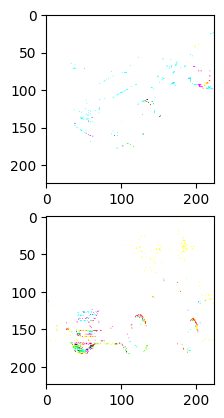

In [206]:
gen = batch_generator(train_df, batch_size=2)
X, y = next(gen)
print(X.shape)
print(y[0].shape, y[1].shape)
print(y)

from keras.utils.np_utils import to_categorical

ll1111 = []
# label_encoder.inverse_transform(y[0][0])
for i in range(0,len(y[0])):
  y1 = int(np.argmax(y[0][i], axis=-1))
  ll1111.extend([y1])

print(len(ll1111))
print(label_encoder.inverse_transform(ll1111))

plt.figure(figsize =(10, 4))

#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(len(y[0]),1) 

for i in range(0,len(y[0])):
  axarr[i].imshow(X[i])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(2, 224, 224, 3)
(2, 196) (2, 4)
[array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
     

<Figure size 1000x400 with 0 Axes>

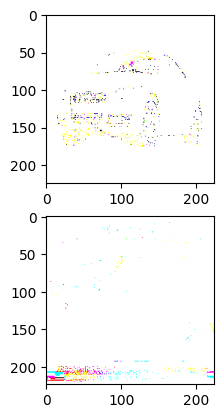

In [207]:
gen = batch_generator(val_df, batch_size=2)
X, y = next(gen)
print(X.shape)
print(y[0].shape, y[1].shape)
print(y)

from keras.utils.np_utils import to_categorical

ll1111 = []
# label_encoder.inverse_transform(y[0][0])
for i in range(0,len(y[0])):
  y1 = int(np.argmax(y[0][i], axis=-1))
  ll1111.extend([y1])

print(len(ll1111))
print(label_encoder.inverse_transform(ll1111))

plt.figure(figsize =(10, 4))

#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(len(y[0]),1) 

for i in range(0,len(y[0])):
  axarr[i].imshow(X[i])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(2, 224, 224, 3)
(2, 196) (2, 4)
[array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
     

<Figure size 1000x400 with 0 Axes>

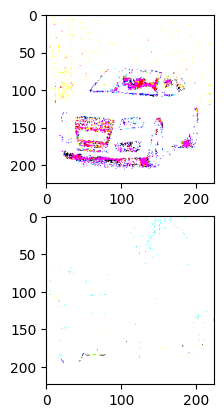

In [208]:
gen = batch_generator(test_df, batch_size=2)
X, y = next(gen)
print(X.shape)
print(y[0].shape, y[1].shape)
print(y)

from keras.utils.np_utils import to_categorical

ll1111 = []
# label_encoder.inverse_transform(y[0][0])
for i in range(0,len(y[0])):
  y1 = int(np.argmax(y[0][i], axis=-1))
  ll1111.extend([y1])

print(len(ll1111))
print(label_encoder.inverse_transform(ll1111))

plt.figure(figsize =(10, 4))

#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(len(y[0]),1) 

for i in range(0,len(y[0])):
  axarr[i].imshow(X[i])

#### Load Pre-Trained Model

In [209]:
tf.keras.backend.clear_session()
model = tf.keras.applications.efficientnet.EfficientNetB5(include_top=False, #Do not include FC layer at the end
                                       input_shape=(224, 224, 3),
                                       weights='imagenet')

In [210]:
model.summary()

Model: "efficientnetb5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 tf.math.truediv (TFOpLambda)   (None, 224, 224, 3)  0           ['normalization[0][0

#### Un-Freeze Few layers of Pre-trained model

In [212]:
len(model.layers)

577

In [213]:
# for layer in model.layers:
#     layer.trainable = True

# # # #Set pre-trained model layers to not trainable
for layer in model.layers:
    layer.trainable = True
#######Unfreezing all layers after layer#
for layer in model.layers[0:257]:
    layer.trainable = False
    # print(layer)

In [214]:
model.summary()

Model: "efficientnetb5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 tf.math.truediv (TFOpLambda)   (None, 224, 224, 3)  0           ['normalization[0][0

In [215]:
model.output

<KerasTensor: shape=(None, 7, 7, 2048) dtype=float32 (created by layer 'top_activation')>

In [216]:
#get Output layer of Pre-trained model
x1 = model.output

#Flatten the output to feed to Dense layer
x2 = tf.keras.layers.GlobalAveragePooling2D()(x1)

#Add one Dense layer
x3 = tf.keras.layers.Dense(2048, activation='relu')(x2)

#Batch Norm
x5 = tf.keras.layers.BatchNormalization()(x3)

In [217]:
#Classification
label_output = tf.keras.layers.Dense(len(num_classes), 
                                     activation='softmax', 
                                     name='class_op')(x5)

In [218]:
#Regression
bbox_output = tf.keras.layers.Dense(4, 
                                    activation='sigmoid', 
                                    name='reg_op')(x5)

In [219]:
bbox_output

<KerasTensor: shape=(None, 4) dtype=float32 (created by layer 'reg_op')>

#### Finalize the model

In [220]:
#Non Sequential model as it has two different outputs
final_model = tf.keras.models.Model(inputs=model.input, #Pre-trained model input as input layer
                                    outputs=[label_output,bbox_output]) #Output layer added

In [221]:
final_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 tf.math.truediv (TFOpLambda)   (None, 224, 224, 3)  0           ['normalization[0][0]']      

#### Define function to calculate IoU

In [222]:
def calculate_iou(y_true, y_pred):
    
    
    """
    Input:
    Keras provides the input as numpy arrays with shape (batch_size, num_columns).
    
    Arguments:
    y_true -- first box, numpy array with format [x, y, width, height, conf_score]
    y_pred -- second box, numpy array with format [x, y, width, height, conf_score]
    x any y are the coordinates of the top left corner of each box.
    
    Output: IoU of type float32. (This is a ratio. Max is 1. Min is 0.)
    
    """

    
    results = []
    
    for i in range(0,y_true.shape[0]):
    
        # set the types so we are sure what type we are using
        y_true = np.array(y_true, dtype=np.float32)
        y_pred = np.array(y_pred, dtype=np.float32)

        #print(y_true.shape)
        #print(y_pred.shape)
        # boxTrue
        x_boxTrue_tleft = y_true[i,0]  # numpy index selection
        y_boxTrue_tleft = y_true[i,1]
        boxTrue_width = y_true[i,2]
        boxTrue_height = y_true[i,3]
        area_boxTrue = (boxTrue_width * boxTrue_height)

        # boxPred
        x_boxPred_tleft = y_pred[i,0]
        y_boxPred_tleft = y_pred[i,1]
        boxPred_width = y_pred[i,2]
        boxPred_height = y_pred[i,3]
        area_boxPred = (boxPred_width * boxPred_height)

        # calculate the bottom right coordinates for boxTrue and boxPred

        # boxTrue
        x_boxTrue_br = x_boxTrue_tleft + boxTrue_width
        y_boxTrue_br = y_boxTrue_tleft + boxTrue_height # Version 2 revision

        # boxPred
        x_boxPred_br = x_boxPred_tleft + boxPred_width
        y_boxPred_br = y_boxPred_tleft + boxPred_height # Version 2 revision


        # calculate the top left and bottom right coordinates for the intersection box, boxInt

        # boxInt - top left coords
        x_boxInt_tleft = np.max([x_boxTrue_tleft,x_boxPred_tleft])
        y_boxInt_tleft = np.max([y_boxTrue_tleft,y_boxPred_tleft]) # Version 2 revision

        # boxInt - bottom right coords
        x_boxInt_br = np.min([x_boxTrue_br,x_boxPred_br])
        y_boxInt_br = np.min([y_boxTrue_br,y_boxPred_br]) 

        # Calculate the area of boxInt, i.e. the area of the intersection 
        # between boxTrue and boxPred.
        # The np.max() function forces the intersection area to 0 if the boxes don't overlap.
        
        
        # Version 2 revision
        area_of_intersection = \
        np.max([0,(x_boxInt_br - x_boxInt_tleft)]) * np.max([0,(y_boxInt_br - y_boxInt_tleft)])

        iou = area_of_intersection / ((area_boxTrue + area_boxPred) - area_of_intersection)


        # This must match the type used in py_func
        iou = np.array(iou, dtype=np.float32)
        
        # append the result to a list at the end of each loop
        results.append(iou)
    
    # return the mean IoU score for the batch
    return np.mean(results)



def IoU(y_true, y_pred):
    
    # Note: the type float32 is very important. It must be the same type as the output from
    # the python function above or you too may spend many late night hours 
    # trying to debug and almost give up.
    
    iou = tf.py_function(calculate_iou, [y_true, y_pred], tf.float32)

    return iou

In [223]:
optimizerVar = tf.keras.optimizers.Adam()
final_model.compile(optimizer=optimizerVar, 
                    loss={'reg_op':'mse', 'class_op':'categorical_crossentropy'},
                    metrics={'reg_op':[IoU], 'class_op':['accuracy']})

In [224]:
#Create train and test generator
batchsize = 32
train_generator = batch_generator(train_df, batch_size=batchsize) #batchsize can be changed
test_generator = batch_generator(val_df, batch_size=batchsize)

In [225]:
history_1 = final_model.fit(train_generator,
                epochs=10,
                steps_per_epoch= train_df.shape[0]//batchsize,validation_data=test_generator,
                validation_steps = val_df.shape[0]//batchsize)

Epoch 1/10
201/201 [==============================] - 53s 196ms/step - loss: 4.4283 - class_op_loss: 4.3695 - reg_op_loss: 0.0588 - class_op_accuracy: 0.2387 - reg_op_IoU: 0.3921 - val_loss: 5.3487 - val_class_op_loss: 5.3277 - val_reg_op_loss: 0.0210 - val_class_op_accuracy: 0.1539 - val_reg_op_IoU: 0.6254
Epoch 2/10
201/201 [==============================] - 35s 174ms/step - loss: 1.9132 - class_op_loss: 1.8981 - reg_op_loss: 0.0152 - class_op_accuracy: 0.5679 - reg_op_IoU: 0.6194 - val_loss: 3.0972 - val_class_op_loss: 3.0832 - val_reg_op_loss: 0.0140 - val_class_op_accuracy: 0.3844 - val_reg_op_IoU: 0.6661
Epoch 3/10
201/201 [==============================] - 35s 174ms/step - loss: 0.9678 - class_op_loss: 0.9557 - reg_op_loss: 0.0121 - class_op_accuracy: 0.7601 - reg_op_IoU: 0.6611 - val_loss: 2.2857 - val_class_op_loss: 2.2743 - val_reg_op_loss: 0.0114 - val_class_op_accuracy: 0.5094 - val_reg_op_IoU: 0.6798
Epoch 4/10
201/201 [==============================] - 36s 181ms/step - lo

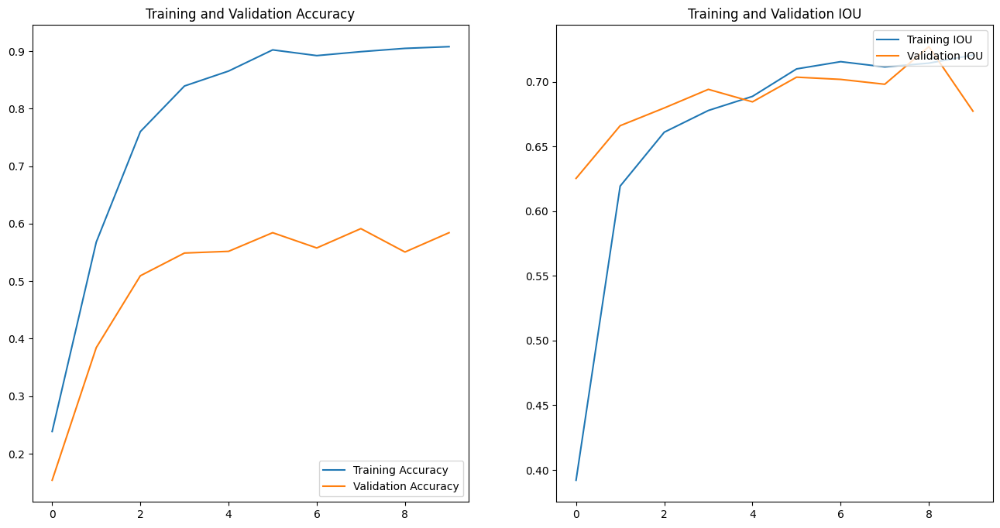

In [226]:
acc = history_1.history['class_op_accuracy']
val_acc = history_1.history['val_class_op_accuracy']

iou = history_1.history['reg_op_IoU']
val_iou = history_1.history['val_reg_op_IoU']

epochs_range = range(10)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, iou, label='Training IOU')
plt.plot(epochs_range, val_iou, label='Validation IOU')
plt.legend(loc='upper right')
plt.title('Training and Validation IOU')
plt.show()

In [227]:
optimizerVar = tf.keras.optimizers.Adam(lr=0.0001)
final_model.compile(optimizer=optimizerVar, 
                    loss={'reg_op':'mse', 'class_op':'categorical_crossentropy'},
                    metrics={'reg_op':[IoU], 'class_op':['accuracy']})

In [228]:
batchsize=16
history_2 = final_model.fit(train_generator,
                epochs=25,
                initial_epoch=10,
                steps_per_epoch= train_df.shape[0]//batchsize,validation_data=test_generator,
                validation_steps = val_df.shape[0]//batchsize)

Epoch 11/25
402/402 [==============================] - 83s 183ms/step - loss: 0.0870 - class_op_loss: 0.0809 - reg_op_loss: 0.0060 - class_op_accuracy: 0.9765 - reg_op_IoU: 0.7559 - val_loss: 1.2270 - val_class_op_loss: 1.2195 - val_reg_op_loss: 0.0075 - val_class_op_accuracy: 0.7394 - val_reg_op_IoU: 0.7588
Epoch 12/25
402/402 [==============================] - 70s 174ms/step - loss: 0.0216 - class_op_loss: 0.0164 - reg_op_loss: 0.0051 - class_op_accuracy: 0.9960 - reg_op_IoU: 0.7699 - val_loss: 1.1736 - val_class_op_loss: 1.1677 - val_reg_op_loss: 0.0060 - val_class_op_accuracy: 0.7580 - val_reg_op_IoU: 0.7696
Epoch 13/25
402/402 [==============================] - 72s 179ms/step - loss: 0.0192 - class_op_loss: 0.0146 - reg_op_loss: 0.0046 - class_op_accuracy: 0.9970 - reg_op_IoU: 0.7783 - val_loss: 1.1528 - val_class_op_loss: 1.1476 - val_reg_op_loss: 0.0052 - val_class_op_accuracy: 0.7703 - val_reg_op_IoU: 0.7744
Epoch 14/25
402/402 [==============================] - 71s 177ms/step 

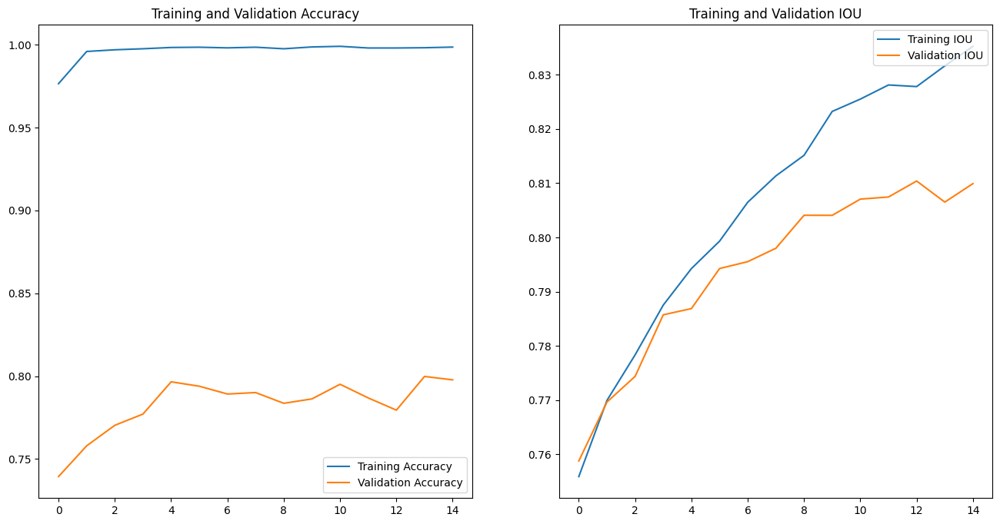

In [229]:
acc = history_2.history['class_op_accuracy']
val_acc = history_2.history['val_class_op_accuracy']

iou = history_2.history['reg_op_IoU']
val_iou = history_2.history['val_reg_op_IoU']

epochs_range = range(15)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, iou, label='Training IOU')
plt.plot(epochs_range, val_iou, label='Validation IOU')
plt.legend(loc='upper right')
plt.title('Training and Validation IOU')
plt.show()

In [231]:
final_model.save('C:/Users/User/Downloads/Car Images/Cars_196_dataset_localization_Adam_EfficientNetB5_Epoch30_V1.h5')

#### Model Prediction

In [232]:
def predict_and_draw(image_num, df):

    #Load image
    img = tf.keras.preprocessing.image.load_img(df.loc[image_num, 'File'])
    w, h = img.size

    #Prepare input for model
    #1. Resize image
    img_resized = img.resize((img_size, img_size))
    #2. Conver to array and make it a batch of 1
    input_array = tf.keras.preprocessing.image.img_to_array(img_resized)
    input_array = np.expand_dims(input_array, axis=0)

    #3. Normalize image data
    input_array = tf.keras.applications.efficientnet.preprocess_input(input_array)

    #Prediction
    pred = final_model.predict(input_array)
    #Get classification and regression predictions
    label_pred, bbox_pred = pred[0][0], pred[1][0]
    #Get Label with highest probability
    pred_class = label_class_dict[np.argmax(label_pred)]

    #Read actual label and bounding box
    act_class = df.loc[image_num, 'Class']
    act_class = df.loc[image_num, 'carName']
    xmin, ymin, xmax, ymax = df.loc[image_num, ['xmin', 'ymin', 'xmax', 'ymax']]

    print('Real Label :', act_class, '\nPredicted Label: ', pred_class)
    
    #Draw bounding boxes - Actual (Red) and Predicted(Green)
    img = cv2.imread(df.loc[image_num, 'File'])
    
    #Draw actual bounding box - Red
    img = cv2.rectangle(img, (xmin, ymin), 
                        (xmax, ymax), (0,0,255), 3)
    
    #Draw predicted bounding box -  Green
    img = cv2.rectangle(img, (int(bbox_pred[0]*w), int(bbox_pred[1]*h)), 
                        (int((bbox_pred[0]+bbox_pred[2])*w), int((bbox_pred[1]+bbox_pred[3])*h)), (0,255,0), 3
                        )

    #Display the picture
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()

1/1 [==============================] - 3s 3s/step
Real Label : Aston Martin Virage Coupe 2012 
Predicted Label:  Aston Martin Virage Coupe 2012


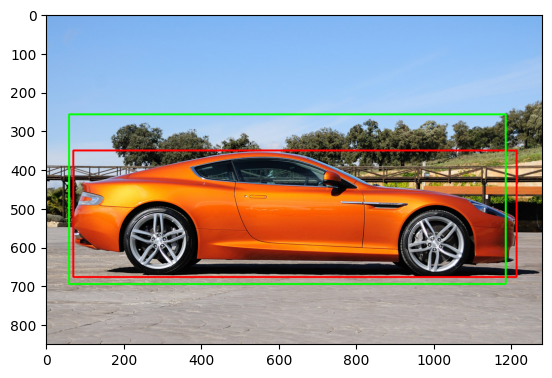

1/1 [==============================] - 0s 24ms/step
Real Label : Bentley Continental GT Coupe 2012 
Predicted Label:  Bentley Continental GT Coupe 2012


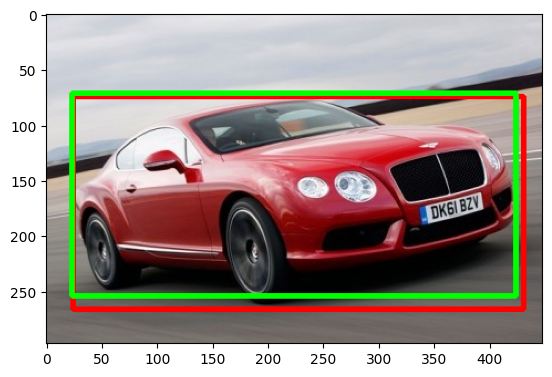

1/1 [==============================] - 0s 21ms/step
Real Label : Bentley Arnage Sedan 2009 
Predicted Label:  Bentley Arnage Sedan 2009


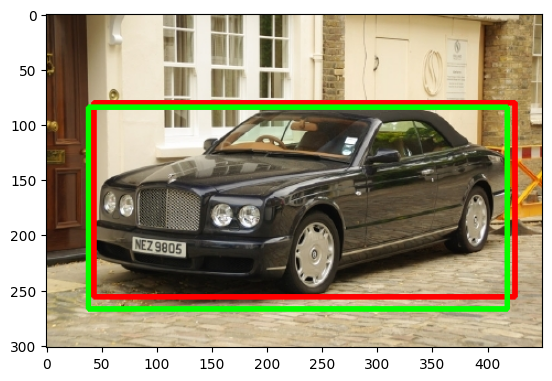

1/1 [==============================] - 0s 23ms/step
Real Label : BMW X5 SUV 2007 
Predicted Label:  BMW X5 SUV 2007


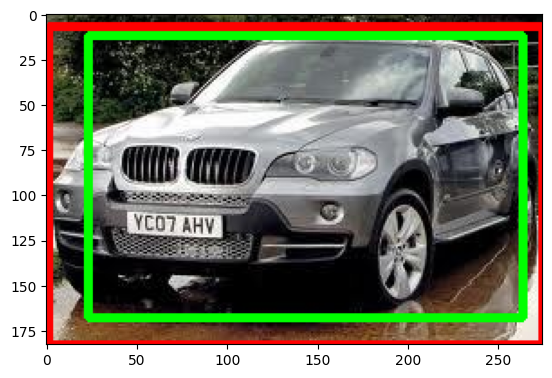

1/1 [==============================] - 0s 27ms/step
Real Label : Dodge Charger Sedan 2012 
Predicted Label:  Dodge Charger Sedan 2012


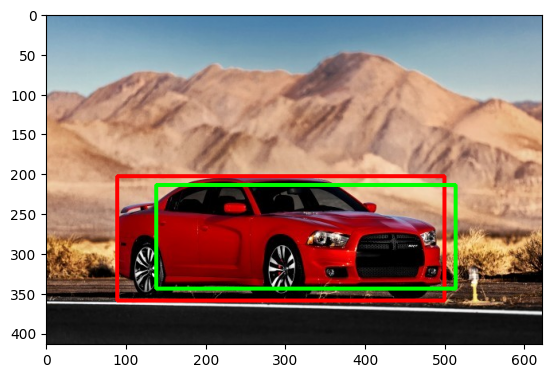

In [233]:
#Predict on Test Dataset
for i in range(0,5):
  image_num = np.random.randint(0, test_df.shape[0])
  predict_and_draw(image_num, test_df)

In [234]:
testData_generator = batch_generator(test_df, batch_size=16)

print('Evaluating')
test_results = final_model.evaluate(testData_generator, batch_size=16, steps=250, verbose=1)
print('\nTest accuracy:', test_results)

Evaluating
250/250 [==============================] - 16s 62ms/step - loss: 1.1020 - class_op_loss: 1.0989 - reg_op_loss: 0.0032 - class_op_accuracy: 0.7860 - reg_op_IoU: 0.8151

Test accuracy: [1.1020424365997314, 1.0988858938217163, 0.0031558703631162643, 0.7860000133514404, 0.8150709271430969]


In [235]:
# act_class = pd.DataFrame()
# pred_class = pd.DataFrame()

dataF = pd.DataFrame(columns=['Actual','Pred'])

def predict_and_develop_dataFrame(image_num, df):

    #Load image
    img = tf.keras.preprocessing.image.load_img(df.loc[image_num, 'File'])
    w, h = img.size

    #Prepare input for model
    #1. Resize image
    img_resized = img.resize((img_size, img_size))
    #2. Conver to array and make it a batch of 1
    input_array = tf.keras.preprocessing.image.img_to_array(img_resized)
    input_array = np.expand_dims(input_array, axis=0)

    #3. Normalize image data
    input_array = tf.keras.applications.efficientnet.preprocess_input(input_array)

    #Prediction
    pred = final_model.predict(input_array, use_multiprocessing = True, )
    #Get classification and regression predictions
    label_pred = pred[0][0]

    #Read actual label 
    # act_class.append((df.loc[image_num, 'carName']).to_frame(), ignore_index = True)
    # # pred_class.append(label_class_dict[np.argmax(label_pred)], ignore_index = True)
    to_append = [df.loc[image_num, 'carName'], label_class_dict[np.argmax(label_pred)]]
    
    # print((to_append))
    # print('Real Label :', df.loc[image_num, 'carName'], '\nPredicted Label: ', label_class_dict[np.argmax(label_pred)])

    df_length = len(dataF)
    dataF.loc[df_length] = to_append

In [ ]:
 for i in range(0,8041):
  predict_and_develop_dataFrame(i,test_df)

1/1 [==============================] - 0s 23ms/step


In [ ]:
from sklearn.metrics import classification_report
y_true = dataF['Actual']
y_pred = dataF['Pred']
target_names = dataF['Actual'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

  Above is the classification report

Below mentioned table classification report for EfficientNet-B5 model. Overall Accuracy is 75%, Precision is 75%, recall is 74% and f1-Score is 74%. As observed in the classification report, for a few classes the number is low and the same is observed in test samples where the model is showing misclassification. The number of samples used for producing reports is 8041. In EfficientNet, the authors propose a new Scaling method called Compound Scaling. 

## Model building for ResNet

In [120]:
img_size = 224

In [121]:
def batch_generator(df, batch_size=32):

    while True:

        #Create indexes
        image_nums = np.random.randint(0,df.shape[0], size=batch_size)

        #Create empty arrays
        #1. To hold image input
        batch_images = np.zeros(shape=(batch_size, img_size, img_size, 3))

        #Classification Labels 
        batch_labels = np.zeros(shape=(batch_size, len(num_classes)))
        
        #Regression labels - 4 numbers per example image
        batch_bboxes = np.zeros(shape=(batch_size, 4))
        

        for i in range(batch_size):

            #Read image and resize
            img = tf.keras.preprocessing.image.load_img(df.loc[image_nums[i], 'File'], 
                                                        target_size=(img_size, img_size))
            
            #Conver to numpy array
            img_array = tf.keras.preprocessing.image.img_to_array(img)

            #Update batch
            batch_images[i] = img_array

            #Read image classification label & convert to one hot vector
            cl_label = df.loc[image_nums[i], 'Label']
            cl_label = tf.keras.utils.to_categorical(cl_label, num_classes=len(num_classes))
            batch_labels[i] = cl_label

            #Read and resize bounding box co-ordinates
            img_width = df.loc[image_nums[i], 'Width']
            img_height = df.loc[image_nums[i], 'Height']
            
            xmin = df.loc[image_nums[i], 'xmin'] * img_size/img_width
            xmax = df.loc[image_nums[i], 'xmax'] * img_size/img_width

            ymin = df.loc[image_nums[i], 'ymin'] * img_size/img_height
            ymax = df.loc[image_nums[i], 'ymax'] * img_size/img_height

            #We will ask model to predict xmin, ymin, width and height of bounding box
            batch_bboxes[i] = [xmin, ymin, xmax-xmin, ymax-ymin]

        #Normalize batch images as per Pre-trained model to be used
        for i in range(batch_size):
            batch_images[i] = tf.keras.applications.resnet.preprocess_input(batch_images[i])
        
        #Make bounding boxes (x, y, w, h) as numbers between 0 and 1 - this seems to work better
        batch_bboxes = batch_bboxes/img_size

        #Return batch - use yield function to make it a python generator
        yield batch_images, [batch_labels, batch_bboxes]

#### Checking the output of the batch generator

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(2, 224, 224, 3)
(2, 196) (2, 4)
[array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
     

<Figure size 1000x400 with 0 Axes>

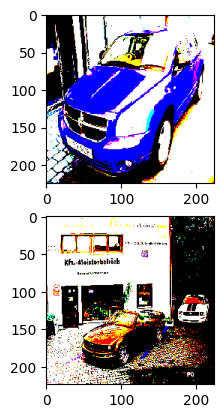

In [122]:
gen = batch_generator(train_df, batch_size=2)
X, y = next(gen)
print(X.shape)
print(y[0].shape, y[1].shape)
print(y)

from keras.utils.np_utils import to_categorical

ll1111 = []
# label_encoder.inverse_transform(y[0][0])
for i in range(0,len(y[0])):
  y1 = int(np.argmax(y[0][i], axis=-1))
  ll1111.extend([y1])

print(len(ll1111))
print(label_encoder.inverse_transform(ll1111))

plt.figure(figsize =(10, 4))

#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(len(y[0]),1) 

for i in range(0,len(y[0])):
  axarr[i].imshow(X[i])

(2, 224, 224, 3)
(2, 196) (2, 4)
[array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
     

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


['Rolls-Royce Ghost Sedan 2012' 'Mercedes-Benz E-Class Sedan 2012']


<Figure size 1000x400 with 0 Axes>

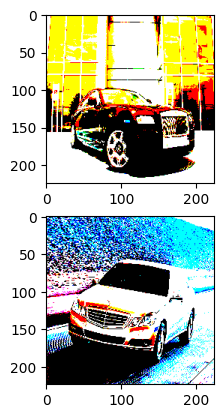

In [123]:
gen = batch_generator(val_df, batch_size=2)
X, y = next(gen)
print(X.shape)
print(y[0].shape, y[1].shape)
print(y)

from keras.utils.np_utils import to_categorical

ll1111 = []
# label_encoder.inverse_transform(y[0][0])
for i in range(0,len(y[0])):
  y1 = int(np.argmax(y[0][i], axis=-1))
  ll1111.extend([y1])

print(len(ll1111))
print(label_encoder.inverse_transform(ll1111))

plt.figure(figsize =(10, 4))

#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(len(y[0]),1) 

for i in range(0,len(y[0])):
  axarr[i].imshow(X[i])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(2, 224, 224, 3)
(2, 196) (2, 4)
[array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
     

<Figure size 1000x400 with 0 Axes>

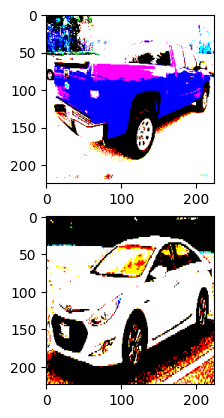

In [124]:
gen = batch_generator(test_df, batch_size=2)
X, y = next(gen)
print(X.shape)
print(y[0].shape, y[1].shape)
print(y)

from keras.utils.np_utils import to_categorical

ll1111 = []
# label_encoder.inverse_transform(y[0][0])
for i in range(0,len(y[0])):
  y1 = int(np.argmax(y[0][i], axis=-1))
  ll1111.extend([y1])

print(len(ll1111))
print(label_encoder.inverse_transform(ll1111))

plt.figure(figsize =(10, 4))

#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(len(y[0]),1) 

for i in range(0,len(y[0])):
  axarr[i].imshow(X[i])

#### Build the Model

#### Load Pre-Trained Model

In [125]:
tf.keras.backend.clear_session()
from tensorflow.keras.applications.resnet50 import ResNet50

model = tf.keras.applications.ResNet50(include_top=False, #Do not include FC layer at the end
                                       input_shape=(224, 224, 3),
                                       weights='imagenet')

In [126]:
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

#### Un-Freeze Few layers of Pre-trained model

In [127]:
len(model.layers)

175

In [128]:
# for layer in model.layers:
#     layer.trainable = True

# # # #Set pre-trained model layers to not trainable
for layer in model.layers:
    layer.trainable = True
# #######Unfreezing all layers after layer#
# for layer in model.layers[0:257]:
#     layer.trainable = False
#     # print(layer)

In [129]:
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [130]:
model.output

<KerasTensor: shape=(None, 7, 7, 2048) dtype=float32 (created by layer 'conv5_block3_out')>

#### Add Final layers to the model

In [131]:
#get Output layer of Pre-trained model
x1 = model.output

#Flatten the output to feed to Dense layer
x2 = tf.keras.layers.GlobalAveragePooling2D()(x1)

#Add one Dense layer
x4_1 = tf.keras.layers.Dense(2048, activation='relu')(x2)

#Add one Dense layer
x4_2 = tf.keras.layers.Dense(512, activation='relu')(x4_1)

x4 = tf.keras.layers.Dropout(0.1)(x4_2)

#Batch Norm
x5 = tf.keras.layers.BatchNormalization()(x4)

#### Build layer for Classification Label output

In [132]:
#Classification
label_output = tf.keras.layers.Dense(len(num_classes), 
                                     activation='softmax', 
                                     name='class_op')(x5)

In [133]:
label_output

<KerasTensor: shape=(None, 196) dtype=float32 (created by layer 'class_op')>

#### Build layer for bounding box output

In [134]:
#Regression
bbox_output = tf.keras.layers.Dense(4, 
                                    activation='sigmoid', 
                                    name='reg_op')(x5)

In [135]:
bbox_output

<KerasTensor: shape=(None, 4) dtype=float32 (created by layer 'reg_op')>

#### Finalize the model

In [136]:
#Non Sequential model as it has two different outputs
final_model = tf.keras.models.Model(inputs=model.input, #Pre-trained model input as input layer
                                    outputs=[label_output,bbox_output]) #Output layer added

In [137]:
final_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

#### Define function to calculate IoU

In [138]:
def calculate_iou(y_true, y_pred):
    
    
    """
    Input:
    Keras provides the input as numpy arrays with shape (batch_size, num_columns).
    
    Arguments:
    y_true -- first box, numpy array with format [x, y, width, height, conf_score]
    y_pred -- second box, numpy array with format [x, y, width, height, conf_score]
    x any y are the coordinates of the top left corner of each box.
    
    Output: IoU of type float32. (This is a ratio. Max is 1. Min is 0.)
    
    """

    
    results = []
    
    for i in range(0,y_true.shape[0]):
    
        # set the types so we are sure what type we are using
        y_true = np.array(y_true, dtype=np.float32)
        y_pred = np.array(y_pred, dtype=np.float32)

        #print(y_true.shape)
        #print(y_pred.shape)
        # boxTrue
        x_boxTrue_tleft = y_true[i,0]  # numpy index selection
        y_boxTrue_tleft = y_true[i,1]
        boxTrue_width = y_true[i,2]
        boxTrue_height = y_true[i,3]
        area_boxTrue = (boxTrue_width * boxTrue_height)

        # boxPred
        x_boxPred_tleft = y_pred[i,0]
        y_boxPred_tleft = y_pred[i,1]
        boxPred_width = y_pred[i,2]
        boxPred_height = y_pred[i,3]
        area_boxPred = (boxPred_width * boxPred_height)

        # calculate the bottom right coordinates for boxTrue and boxPred

        # boxTrue
        x_boxTrue_br = x_boxTrue_tleft + boxTrue_width
        y_boxTrue_br = y_boxTrue_tleft + boxTrue_height # Version 2 revision

        # boxPred
        x_boxPred_br = x_boxPred_tleft + boxPred_width
        y_boxPred_br = y_boxPred_tleft + boxPred_height # Version 2 revision


        # calculate the top left and bottom right coordinates for the intersection box, boxInt

        # boxInt - top left coords
        x_boxInt_tleft = np.max([x_boxTrue_tleft,x_boxPred_tleft])
        y_boxInt_tleft = np.max([y_boxTrue_tleft,y_boxPred_tleft]) # Version 2 revision

        # boxInt - bottom right coords
        x_boxInt_br = np.min([x_boxTrue_br,x_boxPred_br])
        y_boxInt_br = np.min([y_boxTrue_br,y_boxPred_br]) 

        # Calculate the area of boxInt, i.e. the area of the intersection 
        # between boxTrue and boxPred.
        # The np.max() function forces the intersection area to 0 if the boxes don't overlap.
        
        
        # Version 2 revision
        area_of_intersection = \
        np.max([0,(x_boxInt_br - x_boxInt_tleft)]) * np.max([0,(y_boxInt_br - y_boxInt_tleft)])

        iou = area_of_intersection / ((area_boxTrue + area_boxPred) - area_of_intersection)


        # This must match the type used in py_func
        iou = np.array(iou, dtype=np.float32)
        
        # append the result to a list at the end of each loop
        results.append(iou)
    
    # return the mean IoU score for the batch
    return np.mean(results)



def IoU(y_true, y_pred):
    
    # Note: the type float32 is very important. It must be the same type as the output from
    # the python function above or you too may spend many late night hours 
    # trying to debug and almost give up.
    
    iou = tf.py_function(calculate_iou, [y_true, y_pred], tf.float32)

    return iou

In [139]:
optimizerVar = tf.keras.optimizers.Adam()
final_model.compile(optimizer=optimizerVar, 
                    loss={'reg_op':'mse', 'class_op':'categorical_crossentropy'},
                    metrics={'reg_op':[IoU], 'class_op':['accuracy']})

#### Train the model

In [140]:
#Create train and test generator
batchsize = 32
train_generator = batch_generator(train_df, batch_size=batchsize) #batchsize can be changed
test_generator = batch_generator(val_df, batch_size=batchsize)

In [141]:
history_1 = final_model.fit(train_generator,
                epochs=10,
                steps_per_epoch= train_df.shape[0]//batchsize,validation_data=test_generator,
                validation_steps = val_df.shape[0]//batchsize)

Epoch 1/10
201/201 [==============================] - 36s 161ms/step - loss: 5.4603 - class_op_loss: 5.4101 - reg_op_loss: 0.0502 - class_op_accuracy: 0.0082 - reg_op_IoU: 0.4835 - val_loss: 23.1436 - val_class_op_loss: 23.1186 - val_reg_op_loss: 0.0250 - val_class_op_accuracy: 0.0112 - val_reg_op_IoU: 0.6473
Epoch 2/10
201/201 [==============================] - 30s 151ms/step - loss: 5.3543 - class_op_loss: 5.3358 - reg_op_loss: 0.0185 - class_op_accuracy: 0.0087 - reg_op_IoU: 0.6531 - val_loss: 11.4079 - val_class_op_loss: 11.3824 - val_reg_op_loss: 0.0255 - val_class_op_accuracy: 0.0047 - val_reg_op_IoU: 0.6318
Epoch 3/10
201/201 [==============================] - 30s 150ms/step - loss: 5.3033 - class_op_loss: 5.2859 - reg_op_loss: 0.0174 - class_op_accuracy: 0.0115 - reg_op_IoU: 0.6654 - val_loss: 6.5693 - val_class_op_loss: 6.5511 - val_reg_op_loss: 0.0182 - val_class_op_accuracy: 0.0047 - val_reg_op_IoU: 0.6714
Epoch 4/10
201/201 [==============================] - 30s 147ms/step 

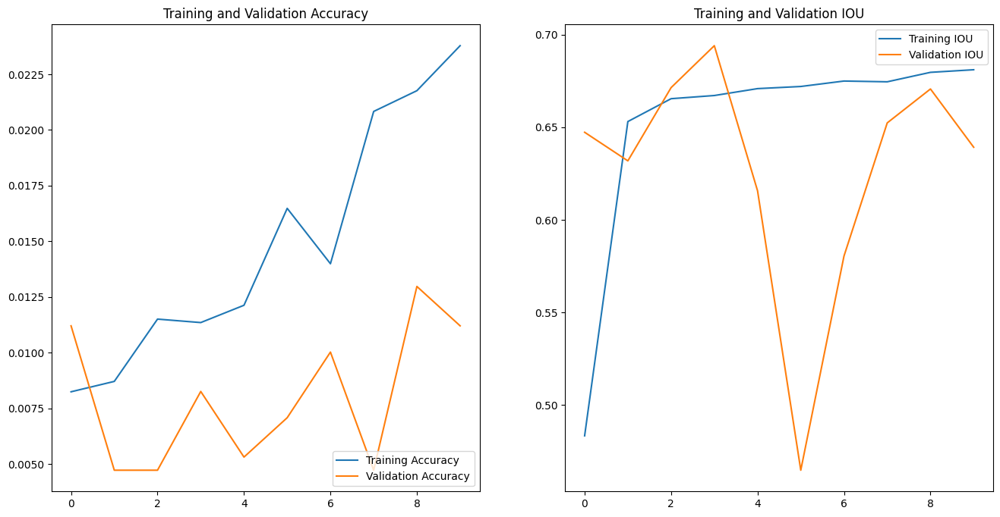

In [142]:
acc = history_1.history['class_op_accuracy']
val_acc = history_1.history['val_class_op_accuracy']

iou = history_1.history['reg_op_IoU']
val_iou = history_1.history['val_reg_op_IoU']

epochs_range = range(10)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, iou, label='Training IOU')
plt.plot(epochs_range, val_iou, label='Validation IOU')
plt.legend(loc='upper right')
plt.title('Training and Validation IOU')
plt.show()

In [143]:
optimizerVar = tf.keras.optimizers.Adam(lr=0.0001)
final_model.compile(optimizer=optimizerVar, 
                    loss={'reg_op':'mse', 'class_op':'categorical_crossentropy'},
                    metrics={'reg_op':[IoU], 'class_op':['accuracy']})

In [144]:
batchsize=16
history_2 = final_model.fit(train_generator,
                epochs=25,
                initial_epoch=10,
                steps_per_epoch= train_df.shape[0]//batchsize,validation_data=test_generator,
                validation_steps = val_df.shape[0]//batchsize)

Epoch 11/25
402/402 [==============================] - 63s 148ms/step - loss: 4.7737 - class_op_loss: 4.7578 - reg_op_loss: 0.0159 - class_op_accuracy: 0.0359 - reg_op_IoU: 0.6818 - val_loss: 4.9007 - val_class_op_loss: 4.8867 - val_reg_op_loss: 0.0140 - val_class_op_accuracy: 0.0265 - val_reg_op_IoU: 0.7024
Epoch 12/25
402/402 [==============================] - 60s 149ms/step - loss: 4.6311 - class_op_loss: 4.6153 - reg_op_loss: 0.0158 - class_op_accuracy: 0.0423 - reg_op_IoU: 0.6821 - val_loss: 4.8189 - val_class_op_loss: 4.8047 - val_reg_op_loss: 0.0143 - val_class_op_accuracy: 0.0336 - val_reg_op_IoU: 0.7017
Epoch 13/25
402/402 [==============================] - 61s 153ms/step - loss: 4.4215 - class_op_loss: 4.4061 - reg_op_loss: 0.0154 - class_op_accuracy: 0.0615 - reg_op_IoU: 0.6828 - val_loss: 5.0934 - val_class_op_loss: 5.0785 - val_reg_op_loss: 0.0149 - val_class_op_accuracy: 0.0236 - val_reg_op_IoU: 0.6933
Epoch 14/25
402/402 [==============================] - 63s 157ms/step 

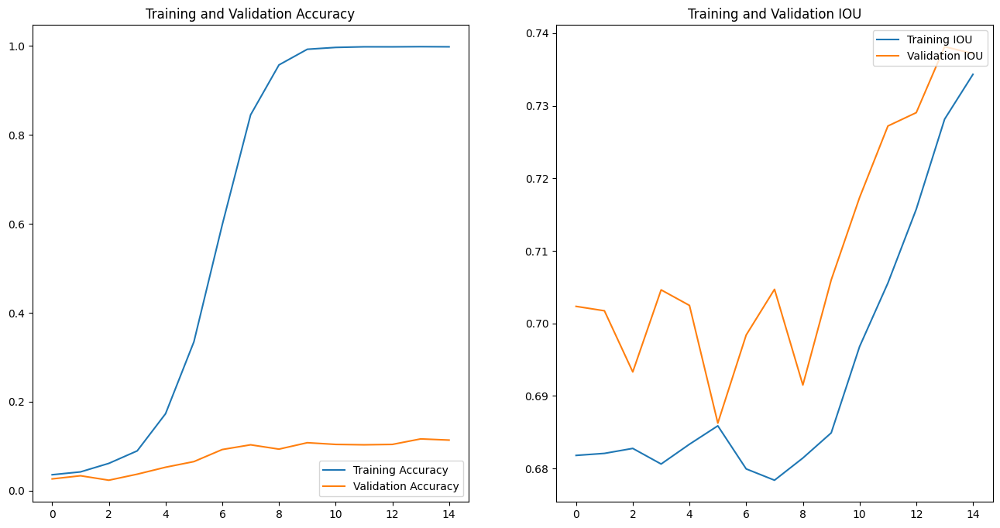

In [145]:
acc = history_2.history['class_op_accuracy']
val_acc = history_2.history['val_class_op_accuracy']

iou = history_2.history['reg_op_IoU']
val_iou = history_2.history['val_reg_op_IoU']

epochs_range = range(15)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, iou, label='Training IOU')
plt.plot(epochs_range, val_iou, label='Validation IOU')
plt.legend(loc='upper right')
plt.title('Training and Validation IOU')
plt.show()

In [146]:
final_model.save(r'C:/Users/User/Downloads/Car Images/Cars_196_dataset_localization_Adam_ResNetNet_Epoch30_V1.h5')

In [147]:
def predict_and_draw(image_num, df):

    #Load image
    img = tf.keras.preprocessing.image.load_img(df.loc[image_num, 'File'])
    w, h = img.size

    #Prepare input for model
    #1. Resize image
    img_resized = img.resize((img_size, img_size))
    #2. Conver to array and make it a batch of 1
    input_array = tf.keras.preprocessing.image.img_to_array(img_resized)
    input_array = np.expand_dims(input_array, axis=0)

    #3. Normalize image data
    input_array = tf.keras.applications.efficientnet.preprocess_input(input_array)

    #Prediction
    pred = final_model.predict(input_array)
    #Get classification and regression predictions
    label_pred, bbox_pred = pred[0][0], pred[1][0]
    #Get Label with highest probability
    pred_class = label_class_dict[np.argmax(label_pred)]

    #Read actual label and bounding box
    act_class = df.loc[image_num, 'Class']
    act_class = df.loc[image_num, 'carName']
    xmin, ymin, xmax, ymax = df.loc[image_num, ['xmin', 'ymin', 'xmax', 'ymax']]

    print('Real Label :', act_class, '\nPredicted Label: ', pred_class)
    
    #Draw bounding boxes - Actual (Red) and Predicted(Green)
    img = cv2.imread(df.loc[image_num, 'File'])
    
    #Draw actual bounding box - Red
    img = cv2.rectangle(img, (xmin, ymin), 
                        (xmax, ymax), (0,0,255), 3)
    
    #Draw predicted bounding box -  Green
    img = cv2.rectangle(img, (int(bbox_pred[0]*w), int(bbox_pred[1]*h)), 
                        (int((bbox_pred[0]+bbox_pred[2])*w), int((bbox_pred[1]+bbox_pred[3])*h)), (0,255,0), 3
                        )

    #Display the picture
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()

1/1 [==============================] - 1s 757ms/step
Real Label : HUMMER H2 SUT Crew Cab 2009 
Predicted Label:  Ford Focus Sedan 2007


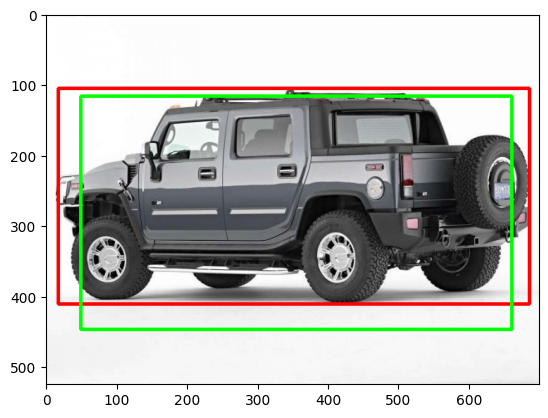

1/1 [==============================] - 0s 15ms/step
Real Label : Chevrolet Silverado 1500 Hybrid Crew Cab 2012 
Predicted Label:  Hyundai Veracruz SUV 2012


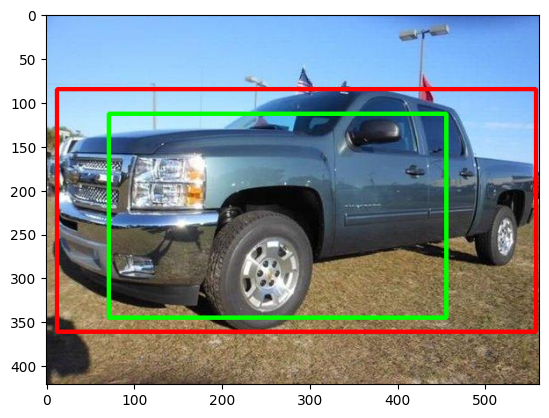

1/1 [==============================] - 0s 14ms/step
Real Label : Dodge Sprinter Cargo Van 2009 
Predicted Label:  Ford Focus Sedan 2007


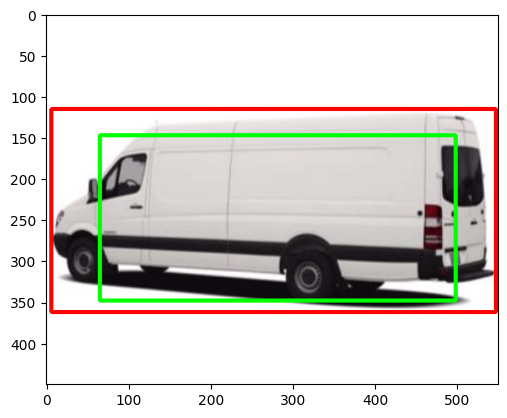

1/1 [==============================] - 0s 17ms/step
Real Label : Bugatti Veyron 16.4 Coupe 2009 
Predicted Label:  Suzuki SX4 Sedan 2012


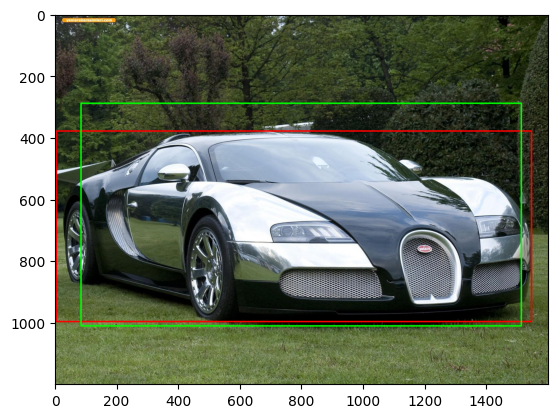

1/1 [==============================] - 0s 14ms/step
Real Label : Volvo C30 Hatchback 2012 
Predicted Label:  Honda Accord Sedan 2012


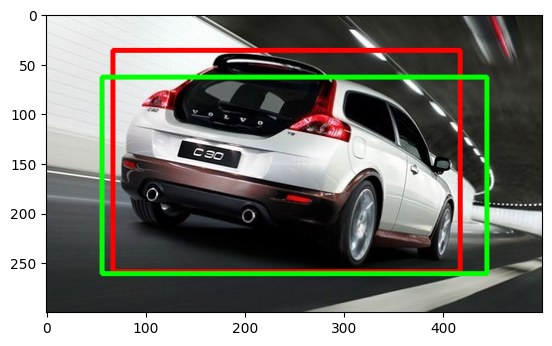

In [148]:
#Predict on Test Dataset
for i in range(0,5):
  image_num = np.random.randint(0, test_df.shape[0])
  predict_and_draw(image_num, test_df)

In [151]:
import threading

# Define a function to handle the timeout
def evaluate_model():
    testData_generator = batch_generator(test_df, batch_size=16)
    print('Evaluating')
    test_results = final_model.evaluate(testData_generator, batch_size=16, steps=250, verbose=1)
    print('\nTest accuracy:', test_results)

# Define the code block to be executed
def execute_with_timeout(timeout_seconds):
    try:
        # Execute the code block
        evaluate_model()
    except Exception as e:
        print("An error occurred:", e)

# Set the timeout duration in seconds
timeout_seconds = 300  # Adjust as needed

# Create a thread to execute the code block
execution_thread = threading.Thread(target=execute_with_timeout, args=(timeout_seconds,))

# Start the thread
execution_thread.start()

# Wait for the thread to finish or timeout
execution_thread.join(timeout_seconds)

# Check if the thread is still alive (means execution is still ongoing)
if execution_thread.is_alive():
    print("Code execution timed out. Terminating...")
    # Terminate the thread (you may need to handle this gracefully depending on your specific use case)
    execution_thread.terminate()
else:
    print("Code execution completed within the specified timeout.")

Evaluating
250/250 [==============================] - 15s 60ms/step - loss: 4.6202 - class_op_loss: 4.6122 - reg_op_loss: 0.0080 - class_op_accuracy: 0.1060 - reg_op_IoU: 0.7335

Test accuracy: [4.620195388793945, 4.6121826171875, 0.008015931583940983, 0.10599999874830246, 0.7335171103477478]
Code execution completed within the specified timeout.


In [152]:
# act_class = pd.DataFrame()
# pred_class = pd.DataFrame()

dataF = pd.DataFrame(columns=['Actual','Pred'])

def predict_and_develop_dataFrame(image_num, df):

    #Load image
    img = tf.keras.preprocessing.image.load_img(df.loc[image_num, 'File'])
    w, h = img.size

    #Prepare input for model
    #1. Resize image
    img_resized = img.resize((img_size, img_size))
    #2. Conver to array and make it a batch of 1
    input_array = tf.keras.preprocessing.image.img_to_array(img_resized)
    input_array = np.expand_dims(input_array, axis=0)

    #3. Normalize image data
    input_array = tf.keras.applications.efficientnet.preprocess_input(input_array)

    #Prediction
    pred = final_model.predict(input_array, use_multiprocessing = True, )
    #Get classification and regression predictions
    label_pred = pred[0][0]

    #Read actual label 
    # act_class.append((df.loc[image_num, 'carName']).to_frame(), ignore_index = True)
    # # pred_class.append(label_class_dict[np.argmax(label_pred)], ignore_index = True)
    to_append = [df.loc[image_num, 'carName'], label_class_dict[np.argmax(label_pred)]]
    
    # print((to_append))
    # print('Real Label :', df.loc[image_num, 'carName'], '\nPredicted Label: ', label_class_dict[np.argmax(label_pred)])

    df_length = len(dataF)
    dataF.loc[df_length] = to_append

In [153]:
 for i in range(0,8041):
  predict_and_develop_dataFrame(i,test_df)

1/1 [==============================] - 0s 15ms/step


In [154]:
dataF

,Actual,Pred
0,Acura Integra Type R 2001,Ford Focus Sedan 2007
1,Acura Integra Type R 2001,Nissan Leaf Hatchback 2012
2,Acura Integra Type R 2001,Honda Odyssey Minivan 2007
3,Acura Integra Type R 2001,Ford Focus Sedan 2007
4,Acura Integra Type R 2001,Ford Focus Sedan 2007
...,...,...
8036,Volvo XC90 SUV 2007,Chevrolet Traverse SUV 2012
8037,Volvo XC90 SUV 2007,Hyundai Veracruz SUV 2012
8038,Volvo XC90 SUV 2007,Hyundai Veracruz SUV 2012
8039,Volvo XC90 SUV 2007,Hyundai Veracruz SUV 2012


In [155]:
from sklearn.metrics import classification_report
y_true = dataF['Actual']
y_pred = dataF['Pred']
target_names = dataF['Actual'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

                                                        precision    recall  f1-score   support

                             Acura Integra Type R 2001       0.00      0.00      0.00        44
                                   Acura RL Sedan 2012       0.00      0.00      0.00        44
                                   Acura TL Sedan 2012       0.01      0.03      0.01        32
                                  Acura TL Type-S 2008       0.00      0.00      0.00        43
                                  Acura TSX Sedan 2012       0.00      0.00      0.00        42
                              Acura ZDX Hatchback 2012       0.00      0.00      0.00        40
                            AM General Hummer SUV 2000       0.07      0.03      0.04        39
              Aston Martin V8 Vantage Convertible 2012       0.25      0.02      0.04        45
                    Aston Martin V8 Vantage Coupe 2012       0.00      0.00      0.00        41
                  Aston Martin Virage C

  Above is the classification report

  Below mentioned table classification report is for Resnet50 model. Overall Accuracy is low for this model. The problem observed for ResNet50 is that the network doesn’t learn well. ResNet follows the conventional approach of scaling the dimensions arbitrarily and by adding up more and more layers. As observed, ResNet is not suitable for this use case. There are misclassifications observed and bounding boxes which are overlaid by model  on the image are misaligned. The number of samples used for producing reports is 8041.


## Model building for Mobile Net

#### Build a Batch Generator

In [156]:
img_size = 224

In [157]:
def batch_generator(df, batch_size=32):

    while True:

        #Create indexes
        image_nums = np.random.randint(0,df.shape[0], size=batch_size)

        #Create empty arrays
        #1. To hold image input
        batch_images = np.zeros(shape=(batch_size, img_size, img_size, 3))

        #Classification Labels 
        batch_labels = np.zeros(shape=(batch_size, len(num_classes)))
        
        #Regression labels - 4 numbers per example image
        batch_bboxes = np.zeros(shape=(batch_size, 4))
        

        for i in range(batch_size):

            #Read image and resize
            img = tf.keras.preprocessing.image.load_img(df.loc[image_nums[i], 'File'], 
                                                        target_size=(img_size, img_size))
            
            #Conver to numpy array
            img_array = tf.keras.preprocessing.image.img_to_array(img)

            #Update batch
            batch_images[i] = img_array

            #Read image classification label & convert to one hot vector
            cl_label = df.loc[image_nums[i], 'Label']
            cl_label = tf.keras.utils.to_categorical(cl_label, num_classes=len(num_classes))
            batch_labels[i] = cl_label

            #Read and resize bounding box co-ordinates
            img_width = df.loc[image_nums[i], 'Width']
            img_height = df.loc[image_nums[i], 'Height']
            
            xmin = df.loc[image_nums[i], 'xmin'] * img_size/img_width
            xmax = df.loc[image_nums[i], 'xmax'] * img_size/img_width

            ymin = df.loc[image_nums[i], 'ymin'] * img_size/img_height
            ymax = df.loc[image_nums[i], 'ymax'] * img_size/img_height

            #We will ask model to predict xmin, ymin, width and height of bounding box
            batch_bboxes[i] = [xmin, ymin, xmax-xmin, ymax-ymin]

        #Normalize batch images as per Pre-trained model to be used
        for i in range(batch_size):
            batch_images[i] = tf.keras.applications.mobilenet_v2.preprocess_input(batch_images[i])
        
        #Make bounding boxes (x, y, w, h) as numbers between 0 and 1 - this seems to work better
        batch_bboxes = batch_bboxes/img_size

        #Return batch - use yield function to make it a python generator
        yield batch_images, [batch_labels, batch_bboxes]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(2, 224, 224, 3)
(2, 196) (2, 4)
[array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
     

<Figure size 1000x400 with 0 Axes>

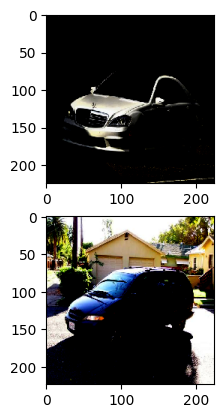

In [158]:
gen = batch_generator(train_df, batch_size=2)
X, y = next(gen)
print(X.shape)
print(y[0].shape, y[1].shape)
print(y)

from keras.utils.np_utils import to_categorical

ll1111 = []
# label_encoder.inverse_transform(y[0][0])
for i in range(0,len(y[0])):
  y1 = int(np.argmax(y[0][i], axis=-1))
  ll1111.extend([y1])

print(len(ll1111))
print(label_encoder.inverse_transform(ll1111))

plt.figure(figsize =(10, 4))

#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(len(y[0]),1) 

for i in range(0,len(y[0])):
  axarr[i].imshow(X[i])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(2, 224, 224, 3)
(2, 196) (2, 4)
[array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
     

<Figure size 1000x400 with 0 Axes>

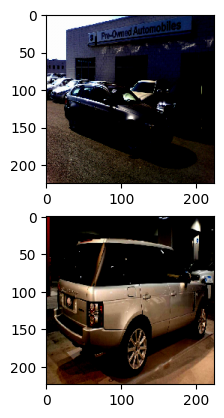

In [159]:
gen = batch_generator(val_df, batch_size=2)
X, y = next(gen)
print(X.shape)
print(y[0].shape, y[1].shape)
print(y)

from keras.utils.np_utils import to_categorical

ll1111 = []
# label_encoder.inverse_transform(y[0][0])
for i in range(0,len(y[0])):
  y1 = int(np.argmax(y[0][i], axis=-1))
  ll1111.extend([y1])

print(len(ll1111))
print(label_encoder.inverse_transform(ll1111))

plt.figure(figsize =(10, 4))

#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(len(y[0]),1) 

for i in range(0,len(y[0])):
  axarr[i].imshow(X[i])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(2, 224, 224, 3)
(2, 196) (2, 4)
[array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
     

<Figure size 1000x400 with 0 Axes>

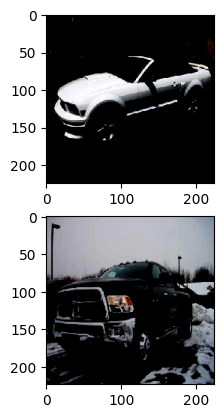

In [160]:
gen = batch_generator(test_df, batch_size=2)
X, y = next(gen)
print(X.shape)
print(y[0].shape, y[1].shape)
print(y)

from keras.utils.np_utils import to_categorical

ll1111 = []
# label_encoder.inverse_transform(y[0][0])
for i in range(0,len(y[0])):
  y1 = int(np.argmax(y[0][i], axis=-1))
  ll1111.extend([y1])

print(len(ll1111))
print(label_encoder.inverse_transform(ll1111))

plt.figure(figsize =(10, 4))

#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(len(y[0]),1) 

for i in range(0,len(y[0])):
  axarr[i].imshow(X[i])

#### Build the Model

#### Load Pre-Trained Model

In [161]:
tf.keras.backend.clear_session()

model = tf.keras.applications.MobileNetV2(include_top=False, #Do not include FC layer at the end
                                       input_shape=(224, 224, 3),
                                       weights='imagenet')

9406464/9406464 [==============================] - 1s 0us/step


In [162]:
model.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                              

#### Un-Freeze Few layers of Pre-trained model

In [163]:
len(model.layers)

154

In [164]:
# for layer in model.layers:
#     layer.trainable = True

# # # #Set pre-trained model layers to not trainable
for layer in model.layers:
    layer.trainable = True
# #######Unfreezing all layers after layer#
# for layer in model.layers[0:257]:
#     layer.trainable = False
#     # print(layer)

In [165]:
model.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                              

In [166]:
model.output

<KerasTensor: shape=(None, 7, 7, 1280) dtype=float32 (created by layer 'out_relu')>

#### Add Final layers to the model

In [167]:
#get Output layer of Pre-trained model
x1 = model.output

#Flatten the output to feed to Dense layer
x2 = tf.keras.layers.GlobalAveragePooling2D()(x1)

x3 = tf.keras.layers.Dropout(0.2)(x2)

#Add one Dense layer
x4_1 = tf.keras.layers.Dense(1280, activation='relu')(x3)

x4_2 = tf.keras.layers.Dropout(0.15)(x4_1)

#Add one Dense layer
x4_3 = tf.keras.layers.Dense(640, activation='relu')(x4_2)

x4_4 = tf.keras.layers.Dropout(0.05)(x4_3)

#Add one Dense layer
x4 = tf.keras.layers.Dense(320, activation='relu')(x4_4)

#Batch Norm
x5 = tf.keras.layers.BatchNormalization()(x4)

#### Build layer for Classification Label output

In [168]:
#Classification
label_output = tf.keras.layers.Dense(len(num_classes), 
                                     activation='softmax', 
                                     name='class_op')(x5)

In [169]:
label_output

<KerasTensor: shape=(None, 196) dtype=float32 (created by layer 'class_op')>

#### Build layer for bounding box output

In [170]:
#Regression
bbox_output = tf.keras.layers.Dense(4, 
                                    activation='sigmoid', 
                                    name='reg_op')(x5)

In [171]:
bbox_output

<KerasTensor: shape=(None, 4) dtype=float32 (created by layer 'reg_op')>

#### Finalize the model

In [172]:
#Non Sequential model as it has two different outputs
final_model = tf.keras.models.Model(inputs=model.input, #Pre-trained model input as input layer
                                    outputs=[label_output,bbox_output]) #Output layer added

In [173]:
final_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                             

#### Define function to calculate IoU

In [174]:
def calculate_iou(y_true, y_pred):
    
    
    """
    Input:
    Keras provides the input as numpy arrays with shape (batch_size, num_columns).
    
    Arguments:
    y_true -- first box, numpy array with format [x, y, width, height, conf_score]
    y_pred -- second box, numpy array with format [x, y, width, height, conf_score]
    x any y are the coordinates of the top left corner of each box.
    
    Output: IoU of type float32. (This is a ratio. Max is 1. Min is 0.)
    
    """

    
    results = []
    
    for i in range(0,y_true.shape[0]):
    
        # set the types so we are sure what type we are using
        y_true = np.array(y_true, dtype=np.float32)
        y_pred = np.array(y_pred, dtype=np.float32)

        #print(y_true.shape)
        #print(y_pred.shape)
        # boxTrue
        x_boxTrue_tleft = y_true[i,0]  # numpy index selection
        y_boxTrue_tleft = y_true[i,1]
        boxTrue_width = y_true[i,2]
        boxTrue_height = y_true[i,3]
        area_boxTrue = (boxTrue_width * boxTrue_height)

        # boxPred
        x_boxPred_tleft = y_pred[i,0]
        y_boxPred_tleft = y_pred[i,1]
        boxPred_width = y_pred[i,2]
        boxPred_height = y_pred[i,3]
        area_boxPred = (boxPred_width * boxPred_height)

        # calculate the bottom right coordinates for boxTrue and boxPred

        # boxTrue
        x_boxTrue_br = x_boxTrue_tleft + boxTrue_width
        y_boxTrue_br = y_boxTrue_tleft + boxTrue_height # Version 2 revision

        # boxPred
        x_boxPred_br = x_boxPred_tleft + boxPred_width
        y_boxPred_br = y_boxPred_tleft + boxPred_height # Version 2 revision


        # calculate the top left and bottom right coordinates for the intersection box, boxInt

        # boxInt - top left coords
        x_boxInt_tleft = np.max([x_boxTrue_tleft,x_boxPred_tleft])
        y_boxInt_tleft = np.max([y_boxTrue_tleft,y_boxPred_tleft]) # Version 2 revision

        # boxInt - bottom right coords
        x_boxInt_br = np.min([x_boxTrue_br,x_boxPred_br])
        y_boxInt_br = np.min([y_boxTrue_br,y_boxPred_br]) 

        # Calculate the area of boxInt, i.e. the area of the intersection 
        # between boxTrue and boxPred.
        # The np.max() function forces the intersection area to 0 if the boxes don't overlap.
        
        
        # Version 2 revision
        area_of_intersection = \
        np.max([0,(x_boxInt_br - x_boxInt_tleft)]) * np.max([0,(y_boxInt_br - y_boxInt_tleft)])

        iou = area_of_intersection / ((area_boxTrue + area_boxPred) - area_of_intersection)


        # This must match the type used in py_func
        iou = np.array(iou, dtype=np.float32)
        
        # append the result to a list at the end of each loop
        results.append(iou)
    
    # return the mean IoU score for the batch
    return np.mean(results)



def IoU(y_true, y_pred):
    
    # Note: the type float32 is very important. It must be the same type as the output from
    # the python function above or you too may spend many late night hours 
    # trying to debug and almost give up.
    
    iou = tf.py_function(calculate_iou, [y_true, y_pred], tf.float32)

    return iou

In [175]:
optimizerVar = tf.keras.optimizers.Adam()
final_model.compile(optimizer=optimizerVar, 
                    loss={'reg_op':'mse', 'class_op':'categorical_crossentropy'},
                    metrics={'reg_op':[IoU], 'class_op':['accuracy']})

#### Train the model

In [176]:
#Create train and test generator
batchsize = 32
train_generator = batch_generator(train_df, batch_size=batchsize) #batchsize can be changed
test_generator = batch_generator(val_df, batch_size=batchsize)

In [177]:
history_1 = final_model.fit(train_generator,
                epochs=10,
                steps_per_epoch= train_df.shape[0]//batchsize,validation_data=test_generator,
                validation_steps = val_df.shape[0]//batchsize)

Epoch 1/10
201/201 [==============================] - 32s 140ms/step - loss: 4.8272 - class_op_loss: 4.7736 - reg_op_loss: 0.0536 - class_op_accuracy: 0.0462 - reg_op_IoU: 0.4319 - val_loss: 16.2926 - val_class_op_loss: 16.2400 - val_reg_op_loss: 0.0526 - val_class_op_accuracy: 0.0065 - val_reg_op_IoU: 0.4690
Epoch 2/10
201/201 [==============================] - 28s 139ms/step - loss: 3.6120 - class_op_loss: 3.5967 - reg_op_loss: 0.0152 - class_op_accuracy: 0.1522 - reg_op_IoU: 0.6491 - val_loss: 9.6507 - val_class_op_loss: 9.6257 - val_reg_op_loss: 0.0250 - val_class_op_accuracy: 0.0189 - val_reg_op_IoU: 0.6014
Epoch 3/10
201/201 [==============================] - 28s 140ms/step - loss: 2.7005 - class_op_loss: 2.6858 - reg_op_loss: 0.0147 - class_op_accuracy: 0.2998 - reg_op_IoU: 0.6674 - val_loss: 19.4243 - val_class_op_loss: 19.3293 - val_reg_op_loss: 0.0950 - val_class_op_accuracy: 0.0071 - val_reg_op_IoU: 0.3775
Epoch 4/10
201/201 [==============================] - 28s 139ms/step 

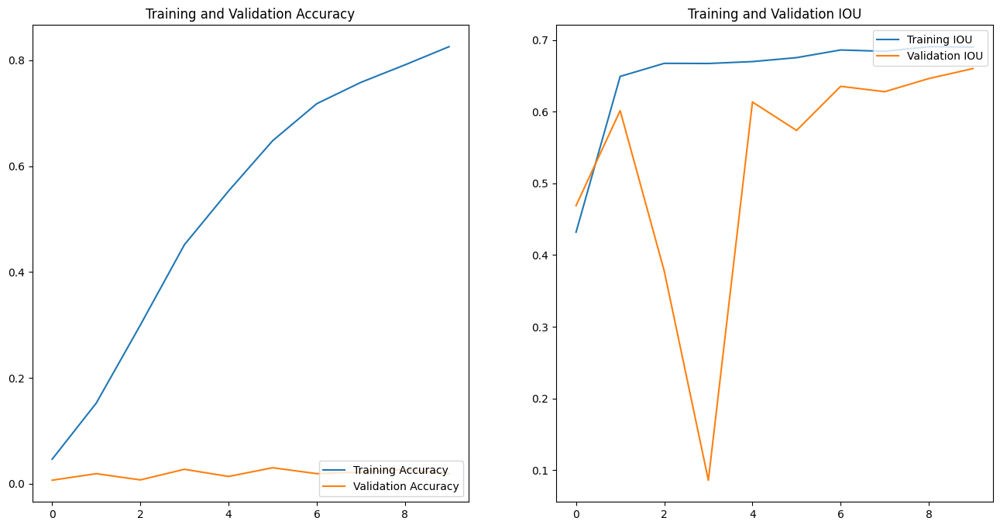

In [178]:
acc = history_1.history['class_op_accuracy']
val_acc = history_1.history['val_class_op_accuracy']

iou = history_1.history['reg_op_IoU']
val_iou = history_1.history['val_reg_op_IoU']

epochs_range = range(10)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, iou, label='Training IOU')
plt.plot(epochs_range, val_iou, label='Validation IOU')
plt.legend(loc='upper right')
plt.title('Training and Validation IOU')
plt.show()

In [179]:
optimizerVar = tf.keras.optimizers.Adam(lr=0.0001)
final_model.compile(optimizer=optimizerVar, 
                    loss={'reg_op':'mse', 'class_op':'categorical_crossentropy'},
                    metrics={'reg_op':[IoU], 'class_op':['accuracy']})

In [180]:
batchsize=16
history_2 = final_model.fit(train_generator,
                epochs=25,
                initial_epoch=10,
                steps_per_epoch= train_df.shape[0]//batchsize,validation_data=test_generator,
                validation_steps = val_df.shape[0]//batchsize)

Epoch 11/25
402/402 [==============================] - 59s 140ms/step - loss: 0.2398 - class_op_loss: 0.2275 - reg_op_loss: 0.0124 - class_op_accuracy: 0.9426 - reg_op_IoU: 0.7002 - val_loss: 4.7830 - val_class_op_loss: 4.7691 - val_reg_op_loss: 0.0139 - val_class_op_accuracy: 0.2630 - val_reg_op_IoU: 0.6869
Epoch 12/25
402/402 [==============================] - 54s 135ms/step - loss: 0.1126 - class_op_loss: 0.1007 - reg_op_loss: 0.0119 - class_op_accuracy: 0.9830 - reg_op_IoU: 0.7034 - val_loss: 2.2411 - val_class_op_loss: 2.2288 - val_reg_op_loss: 0.0123 - val_class_op_accuracy: 0.5000 - val_reg_op_IoU: 0.6978
Epoch 13/25
402/402 [==============================] - 56s 138ms/step - loss: 0.0733 - class_op_loss: 0.0616 - reg_op_loss: 0.0117 - class_op_accuracy: 0.9927 - reg_op_IoU: 0.7040 - val_loss: 1.6276 - val_class_op_loss: 1.6158 - val_reg_op_loss: 0.0118 - val_class_op_accuracy: 0.5887 - val_reg_op_IoU: 0.6999
Epoch 14/25
402/402 [==============================] - 56s 138ms/step 

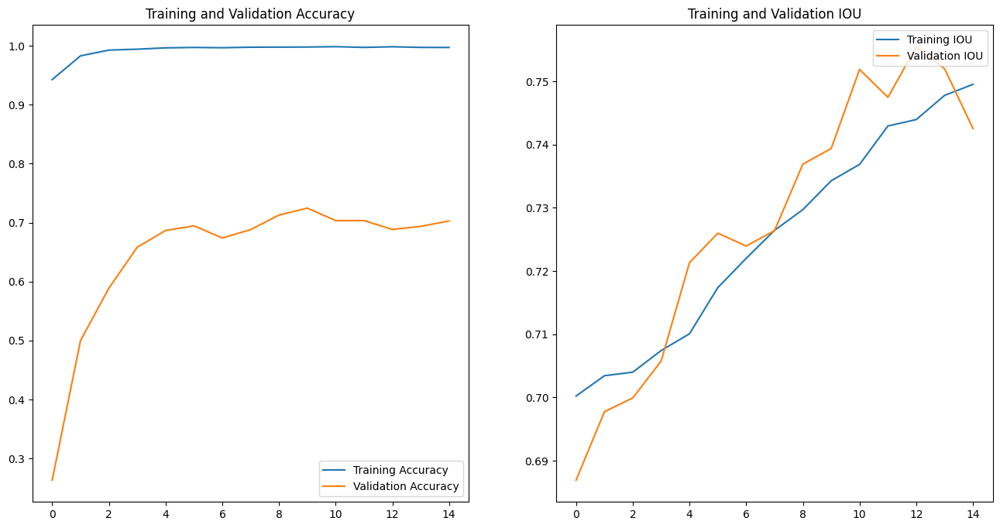

In [181]:
acc = history_2.history['class_op_accuracy']
val_acc = history_2.history['val_class_op_accuracy']

iou = history_2.history['reg_op_IoU']
val_iou = history_2.history['val_reg_op_IoU']

epochs_range = range(15)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, iou, label='Training IOU')
plt.plot(epochs_range, val_iou, label='Validation IOU')
plt.legend(loc='upper right')
plt.title('Training and Validation IOU')
plt.show()

In [182]:
final_model.save(r'C:\Users\User\Downloads\Car Images\Cars_196_dataset_localization_Adam_MobileNet_Epoch30_V1.h5')

#### Model Prediction

In [183]:
def predict_and_draw(image_num, df):

    #Load image
    img = tf.keras.preprocessing.image.load_img(df.loc[image_num, 'File'])
    w, h = img.size

    #Prepare input for model
    #1. Resize image
    img_resized = img.resize((img_size, img_size))
    #2. Conver to array and make it a batch of 1
    input_array = tf.keras.preprocessing.image.img_to_array(img_resized)
    input_array = np.expand_dims(input_array, axis=0)

    #3. Normalize image data
    input_array = tf.keras.applications.efficientnet.preprocess_input(input_array)

    #Prediction
    pred = final_model.predict(input_array)
    #Get classification and regression predictions
    label_pred, bbox_pred = pred[0][0], pred[1][0]
    #Get Label with highest probability
    pred_class = label_class_dict[np.argmax(label_pred)]

    #Read actual label and bounding box
    act_class = df.loc[image_num, 'Class']
    act_class = df.loc[image_num, 'carName']
    xmin, ymin, xmax, ymax = df.loc[image_num, ['xmin', 'ymin', 'xmax', 'ymax']]

    print('Real Label :', act_class, '\nPredicted Label: ', pred_class)
    
    #Draw bounding boxes - Actual (Red) and Predicted(Green)
    img = cv2.imread(df.loc[image_num, 'File'])
    
    #Draw actual bounding box - Red
    img = cv2.rectangle(img, (xmin, ymin), 
                        (xmax, ymax), (0,0,255), 3)
    
    #Draw predicted bounding box -  Green
    img = cv2.rectangle(img, (int(bbox_pred[0]*w), int(bbox_pred[1]*h)), 
                        (int((bbox_pred[0]+bbox_pred[2])*w), int((bbox_pred[1]+bbox_pred[3])*h)), (0,255,0), 3
                        )

    #Display the picture
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()

1/1 [==============================] - 1s 629ms/step
Real Label : Bentley Continental GT Coupe 2007 
Predicted Label:  Buick Verano Sedan 2012


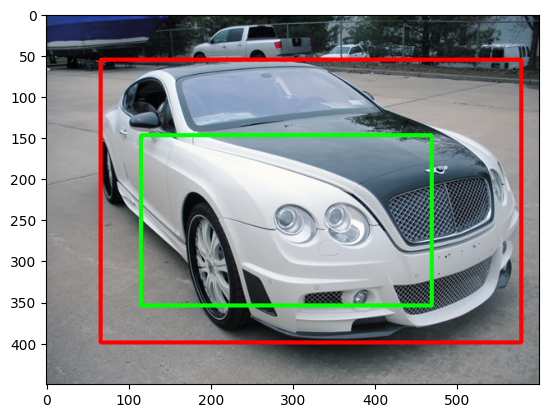

1/1 [==============================] - 0s 14ms/step
Real Label : Dodge Dakota Club Cab 2007 
Predicted Label:  HUMMER H3T Crew Cab 2010


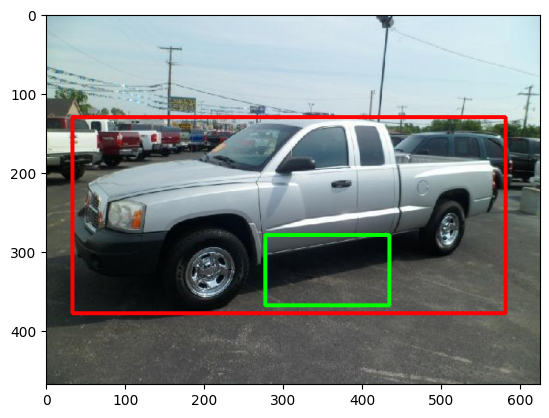

1/1 [==============================] - 0s 15ms/step
Real Label : McLaren MP4-12C Coupe 2012 
Predicted Label:  Lamborghini Gallardo LP 570-4 Superleggera 2012


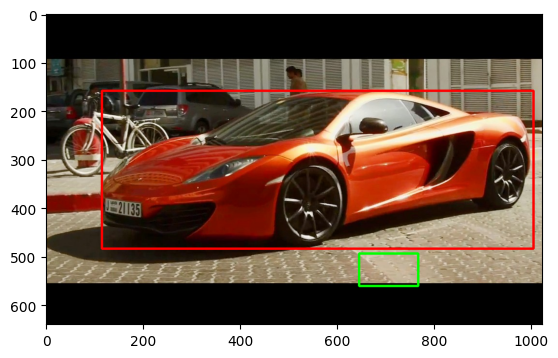

1/1 [==============================] - 0s 15ms/step
Real Label : Volvo 240 Sedan 1993 
Predicted Label:  Ford Fiesta Sedan 2012


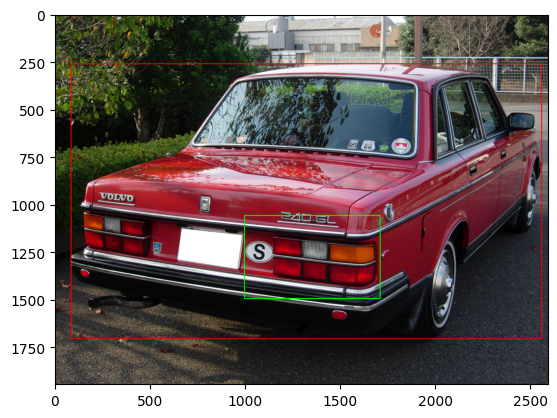

1/1 [==============================] - 0s 14ms/step
Real Label : Jeep Grand Cherokee SUV 2012 
Predicted Label:  Chevrolet Traverse SUV 2012


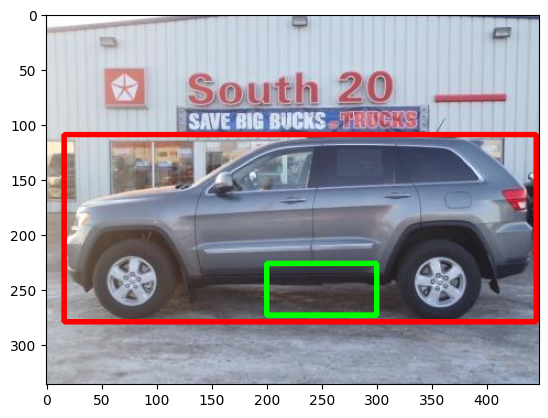

In [184]:
#Predict on Test Dataset
for i in range(0,5):
  image_num = np.random.randint(0, test_df.shape[0])
  predict_and_draw(image_num, test_df)

In [185]:
import threading

# Define a function to handle the timeout
def evaluate_model():
    testData_generator = batch_generator(test_df, batch_size=16)
    print('Evaluating')
    test_results = final_model.evaluate(testData_generator, batch_size=16, steps=250, verbose=1)
    print('\nTest accuracy:', test_results)

# Define the code block to be executed
def execute_with_timeout(timeout_seconds):
    try:
        # Execute the code block
        evaluate_model()
    except Exception as e:
        print("An error occurred:", e)

# Set the timeout duration in seconds
timeout_seconds = 300  # Adjust as needed

# Create a thread to execute the code block
execution_thread = threading.Thread(target=execute_with_timeout, args=(timeout_seconds,))

# Start the thread
execution_thread.start()

# Wait for the thread to finish or timeout
execution_thread.join(timeout_seconds)

# Check if the thread is still alive (means execution is still ongoing)
if execution_thread.is_alive():
    print("Code execution timed out. Terminating...")
    # Terminate the thread (you may need to handle this gracefully depending on your specific use case)
    execution_thread.terminate()
else:
    print("Code execution completed within the specified timeout.")

Evaluating
250/250 [==============================] - 14s 54ms/step - loss: 1.3123 - class_op_loss: 1.3064 - reg_op_loss: 0.0059 - class_op_accuracy: 0.7045 - reg_op_IoU: 0.7503

Test accuracy: [1.3123409748077393, 1.3063918352127075, 0.005949489772319794, 0.7045000195503235, 0.7502768635749817]
Code execution completed within the specified timeout.


In [186]:
# act_class = pd.DataFrame()
# pred_class = pd.DataFrame()

dataF = pd.DataFrame(columns=['Actual','Pred'])

def predict_and_develop_dataFrame(image_num, df):

    #Load image
    img = tf.keras.preprocessing.image.load_img(df.loc[image_num, 'File'])
    w, h = img.size

    #Prepare input for model
    #1. Resize image
    img_resized = img.resize((img_size, img_size))
    #2. Conver to array and make it a batch of 1
    input_array = tf.keras.preprocessing.image.img_to_array(img_resized)
    input_array = np.expand_dims(input_array, axis=0)

    #3. Normalize image data
    input_array = tf.keras.applications.efficientnet.preprocess_input(input_array)

    #Prediction
    pred = final_model.predict(input_array, use_multiprocessing = True, )
    #Get classification and regression predictions
    label_pred = pred[0][0]

    #Read actual label 
    # act_class.append((df.loc[image_num, 'carName']).to_frame(), ignore_index = True)
    # # pred_class.append(label_class_dict[np.argmax(label_pred)], ignore_index = True)
    to_append = [df.loc[image_num, 'carName'], label_class_dict[np.argmax(label_pred)]]
    
    # print((to_append))
    # print('Real Label :', df.loc[image_num, 'carName'], '\nPredicted Label: ', label_class_dict[np.argmax(label_pred)])

    df_length = len(dataF)
    dataF.loc[df_length] = to_append

In [187]:
 for i in range(0,8041):
  predict_and_develop_dataFrame(i,test_df)

1/1 [==============================] - 0s 14ms/step


In [188]:
from sklearn.metrics import classification_report
y_true = dataF['Actual']
y_pred = dataF['Pred']
target_names = dataF['Actual'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

                                                        precision    recall  f1-score   support

                             Acura Integra Type R 2001       0.00      0.00      0.00        44
                                   Acura RL Sedan 2012       0.03      0.07      0.04        44
                                   Acura TL Sedan 2012       0.00      0.00      0.00        32
                                  Acura TL Type-S 2008       0.00      0.00      0.00        43
                                  Acura TSX Sedan 2012       0.00      0.00      0.00        42
                              Acura ZDX Hatchback 2012       0.00      0.00      0.00        40
                            AM General Hummer SUV 2000       0.33      0.05      0.09        39
              Aston Martin V8 Vantage Convertible 2012       0.00      0.00      0.00        45
                    Aston Martin V8 Vantage Coupe 2012       0.07      0.10      0.08        41
                  Aston Martin Virage C

  Above is the classification report
Below mentioned table classification report for MobileNet model. Overall Accuracy is low for this model. The problem observed for MobileNet is that the network is a small network and not suitable for this use case, the number of weights which are to be learnt is very less leading to misclassification and bounding boxes which are overlaid by model  on the image are misaligned. The number of samples used for producing reports is 8041

**Conclusion**

Through the experiments conducted with various CNN models, it's evident that EfficientNet-b7 stands out, offering superior accuracy and regression output compared to other models. EfficientNet is a convolutional neural network architecture and scaling method that uniformly scales all dimensions of depth, width, and resolution using a compound coefficient. This scaling method differs from conventional practices by uniformly scaling network width, depth, and resolution with a set of fixed scaling coefficients.

Efficient-B7 comprises 813 layers with approximately 71 million weights to be learned. In our training, we've worked with around 67 million parameters, focusing on learning from layer 357 and beyond. These deeper layers delve into the intricacies of images, contributing to the development of a well-trained model.

For classification tasks, we utilize categorical_crossentropy, while mean squared error (MSE) serves for regression. The model's overall loss is determined by combining regression and classification losses. To assess the accuracy of bounding boxes on images, we've implemented a function to calculate Intersection over Union (IOU), a metric crucial for evaluating object detectors.

Efficientnet-b7's trainable layers start from layer number 351, amounting to 64 million trainable parameters. The final layer of the model comprises GlobalAveragePooling2D, one Dense layer, and a Batch normalization layer. We employ softmax activation function with 196 classes for classification and sigmoid activation function for the four coordinates of the bounding box in regression tasks.

EfficientNet-B7 was our chosen model for this phase of the project. However, as an interim submission, we plan to explore other networks and methodologies further. Our ongoing experiments include YOLO, utilizing the TFOD framework to determine the most effective approach. Additionally, we have initiated work with EfficientDet. For the final submission, we will conduct a comprehensive comparison of all models and deploy the best-performing model, presenting the results through a user-friendly interface.